# AV Behavior with friction implementation in rainy weather

In [1]:
import os
import pandas as pd
pd.set_option('display.max_colwidth', None)
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import scipy.stats
from scipy.stats import norm, binom, poisson
from dtaidistance import dtw
import json

## Testing Parameters

In [2]:
weather_param = [[20,0,0,5,0,0,0,10,0],
        [20,20,20,5,0,20,5,20,0],
        [40,40,40,5,0,40,10,30,0],
        [60,60,60,5,0,60,15,40,0],
        [80,80,80,5,0,80,20,50,0],
        [100,100,100,5,0,100,30,70,0]] 

def calc_fric(weather_list):
    return np.exp(-0.916*weather_list[5]/100) * (1-weather_list[5]/100)**3 * 0.6 + 0.4 - 0.1*weather_list[2]/100

for i in range(len(weather_param)):
    friction_ratio = calc_fric(weather_param[i])
    weather_param[i] += [friction_ratio]

df = pd.DataFrame(weather_param, columns =["cloudiness","precipitation","precipitation_deposits","sun_altitude_angle","sun_azimuth_angle","wetness","fog_density","wind_intensity", "ice_thickness", "friction_ratio"],
) 
# df.index.name = 'Scenarios'
df

,cloudiness,precipitation,precipitation_deposits,sun_altitude_angle,sun_azimuth_angle,wetness,fog_density,wind_intensity,ice_thickness,friction_ratio
0,20,0,0,5,0,0,0,10,0,1.000000
1,20,20,20,5,0,20,5,20,0,0.635775
2,40,40,40,5,0,40,10,30,0,0.449842
3,60,60,60,5,0,60,15,40,0,0.362164
4,80,80,80,5,0,80,20,50,0,0.322307
5,100,100,100,5,0,100,30,70,0,0.300000


### With reduced friction

In [3]:
os.chdir("C:\\Users\kilob\Senior Research & Thesis\\Simulations")

In [4]:
rel_path = "./Data/Lead Slowdown/Rainy Reduced Friction Exponential"
os.path.isdir(rel_path)

True

In [5]:
subfolders = os.listdir(path=rel_path)
subfolders

['route_highway_epoch24_clear-sunset_fi_lead_slowdown',
 'route_highway_epoch24_rain-sunset-100_fi_lead_slowdown',
 'route_highway_epoch24_rain-sunset-20_fi_lead_slowdown',
 'route_highway_epoch24_rain-sunset-40_fi_lead_slowdown',
 'route_highway_epoch24_rain-sunset-60_fi_lead_slowdown',
 'route_highway_epoch24_rain-sunset-80_fi_lead_slowdown']

In [6]:
head = subfolders.pop(1)
subfolders.append(head)
subfolders

['route_highway_epoch24_clear-sunset_fi_lead_slowdown',
 'route_highway_epoch24_rain-sunset-20_fi_lead_slowdown',
 'route_highway_epoch24_rain-sunset-40_fi_lead_slowdown',
 'route_highway_epoch24_rain-sunset-60_fi_lead_slowdown',
 'route_highway_epoch24_rain-sunset-80_fi_lead_slowdown',
 'route_highway_epoch24_rain-sunset-100_fi_lead_slowdown']

In [7]:
txt_lists_fric = [[] for i in range(6)]

for i in range(len(txt_lists_fric)):
    for root, dirs, files in os.walk(os.path.join(rel_path, subfolders[i])):
        for file in files:
            if file.endswith(".txt"):
                 with open(os.path.join(root, file), encoding = 'utf-8') as f:
                    read_string = f.read()
                    json_object = json.loads(read_string)
                    txt_lists_fric[i].append(json_object)

In [8]:
txt_lists_fric[2][50]
# txt_lists_fric[0]

{'_checkpoint': {'global_record': {},
  'progress': [0, 1],
  'records': [{'index': 0,
    'infractions': {'collisions_layout': [],
     'collisions_pedestrian': [],
     'collisions_vehicle': [],
     'outside_route_lanes': [],
     'red_light': [],
     'route_dev': [],
     'route_timeout': [],
     'stop_infraction': [],
     'vehicle_blocked': []},
    'meta': {'duration_game': 23.92500035651028,
     'duration_system': 41.19178652763367,
     'route_length': 131.56012567009267},
    'route_id': 'RouteScenario_0',
    'scores': {'score_composed': 100.0,
     'score_penalty': 1.0,
     'score_route': 100.0},
    'status': 'Completed'}]},
 'eligible': False,
 'entry_status': 'Started',
 'labels': [],
 'sensors': ['carla_camera',
  'carla_camera',
  'carla_camera',
  'carla_imu',
  'carla_gnss',
  'carla_speedometer'],
 'values': []}

In [9]:
avg_complete_fric = [_] * 6

for i in range(len(txt_lists_fric)):
    count = 0
    for txt in txt_lists_fric[i]:
        if txt['_checkpoint']['records'][0]['status'] == 'Completed':
            count += 1
    avg_complete_fric[i] = count/100
    
df = pd.DataFrame({'Scenarios':subfolders, 'Average complete ratio':avg_complete_fric}) 
# df.index.name = 'Scenarios'

df

,Scenarios,Average complete ratio
0,route_highway_epoch24_clear-sunset_fi_lead_slowdown,1.0
1,route_highway_epoch24_rain-sunset-20_fi_lead_slowdown,1.0
2,route_highway_epoch24_rain-sunset-40_fi_lead_slowdown,1.0
3,route_highway_epoch24_rain-sunset-60_fi_lead_slowdown,1.0
4,route_highway_epoch24_rain-sunset-80_fi_lead_slowdown,1.0
5,route_highway_epoch24_rain-sunset-100_fi_lead_slowdown,1.0


In [10]:
count = 0

avg_score_fric = [_] * 6

for i in range(len(txt_lists_fric)):
    count = 0
    for txt in txt_lists_fric[i]:
        count += txt['_checkpoint']['records'][0]['scores']['score_route'] 
    avg_score_fric[i] = count/100
    
df = pd.DataFrame({'Scenarios':subfolders, 'Average score route':avg_score_fric}) 
df

,Scenarios,Average score route
0,route_highway_epoch24_clear-sunset_fi_lead_slowdown,100.0
1,route_highway_epoch24_rain-sunset-20_fi_lead_slowdown,100.0
2,route_highway_epoch24_rain-sunset-40_fi_lead_slowdown,100.0
3,route_highway_epoch24_rain-sunset-60_fi_lead_slowdown,100.0
4,route_highway_epoch24_rain-sunset-80_fi_lead_slowdown,100.0
5,route_highway_epoch24_rain-sunset-100_fi_lead_slowdown,100.0


#### Setting up into list of DataFrames

In [11]:
os.chdir("C:\\Users\kilob\Senior Research & Thesis\\Simulations")

In [12]:
df_array_fric = np.empty((6,100), dtype=object)

for i in range(len(df_array_fric)):
    for j in range((len(df_array_fric[i]))):
        df_array_fric[i][j] = pd.DataFrame()

In [13]:
for i in range(len(txt_lists_fric)):
    dir_path = os.path.join(rel_path, subfolders[i])
    print(dir_path)
    # list to store files
    res = []

    # Iterate directory
    run_index = 0
    for path in os.listdir(dir_path):
        # check if current path is a file
        if not os.path.isfile(os.path.join(dir_path, path)):
            df = pd.DataFrame()
            for file in os.listdir(os.path.join(dir_path, path)):
                file_path = os.path.join(dir_path, os.path.join(path, file))
    #             print("file_path", file_path)
                if "_ctl.csv" in file_path:
                    df = pd.read_csv(file_path)
                elif "_cvip.csv" in file_path:
                    temp = pd.read_csv(file_path)
                    df = pd.concat([df, temp], axis=1)
                elif "_traj.csv" in file_path:
                    temp = pd.read_csv(file_path)
                    df = pd.concat([df, temp], axis=1)

            df_array_fric[i][run_index] = df
            run_index += 1

./Data/Lead Slowdown/Rainy Reduced Friction Exponential\route_highway_epoch24_clear-sunset_fi_lead_slowdown
./Data/Lead Slowdown/Rainy Reduced Friction Exponential\route_highway_epoch24_rain-sunset-20_fi_lead_slowdown
./Data/Lead Slowdown/Rainy Reduced Friction Exponential\route_highway_epoch24_rain-sunset-40_fi_lead_slowdown
./Data/Lead Slowdown/Rainy Reduced Friction Exponential\route_highway_epoch24_rain-sunset-60_fi_lead_slowdown
./Data/Lead Slowdown/Rainy Reduced Friction Exponential\route_highway_epoch24_rain-sunset-80_fi_lead_slowdown
./Data/Lead Slowdown/Rainy Reduced Friction Exponential\route_highway_epoch24_rain-sunset-100_fi_lead_slowdown


In [14]:
df_array_fric[4][99]

,ts,agent_id,throttle,steer,brake,ts,agent_id,cvip,cvip_x,cvip_y,cvip_z,ts,agent_id,x,y,z,v
0,3196035,0,0.900000,-0.016862,0.0,3196035,0,502.132203,192.853958,-44.172195,-499.788727,3196035,0,192.362411,-86.262680,0.576039,0.000000
1,3196036,0,0.900000,-0.002453,0.0,3196036,0,502.126136,192.853958,-44.172195,-499.823944,3196036,0,192.362411,-86.262680,0.534733,0.000000
2,3196037,0,0.900000,-0.009708,0.0,3196037,0,502.120028,192.853958,-44.172195,-499.865234,3196037,0,192.362411,-86.262680,0.487313,0.000000
3,3196038,0,0.900000,-0.007685,0.0,3196038,0,502.113942,192.853958,-44.172195,-499.912659,3196038,0,192.362411,-86.262680,0.433781,0.000000
4,3196039,0,0.900000,-0.005553,0.0,3196039,0,502.107849,192.853958,-44.172195,-499.966187,3196039,0,192.362411,-86.262680,0.374139,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
963,3196998,0,0.376907,-0.006048,0.0,3196998,0,29.869622,192.810837,72.855835,-0.068174,3196998,0,193.191071,42.988670,-0.021110,9.055098
964,3196999,0,0.403427,-0.004520,0.0,3196999,0,29.941224,192.806015,73.153732,-0.068173,3196999,0,193.186691,43.214966,-0.021106,9.053074
965,3197000,0,0.345348,-0.005180,0.0,3197000,0,30.012921,192.801193,73.451660,-0.068173,3197000,0,193.182358,43.441196,-0.021102,9.050250
966,3197001,0,0.232753,-0.003452,0.0,3197001,0,30.084742,192.796402,73.749626,-0.068173,3197001,0,193.178146,43.667343,-0.021099,9.046648


In [15]:
df_array_fric[0][0]['x']

0      192.362411
1      192.362411
2      192.362411
3      192.362411
4      192.362411
          ...    
944    193.153473
945    193.149857
946    193.146515
947    193.143448
948    193.140701
Name: x, Length: 949, dtype: float64

### Without friction reduction

In [16]:
os.chdir("C:\\Users\kilob\Senior Research & Thesis\\Simulations")

In [17]:
rel_path = "./Data/Lead Slowdown/Rainy Original/"
os.path.isdir(rel_path)

True

In [18]:
subfolders = os.listdir(path=rel_path)
subfolders

['route_highway_epoch24_clear-sunset_fi_lead_slowdown',
 'route_highway_epoch24_rain-sunset-100_fi_lead_slowdown',
 'route_highway_epoch24_rain-sunset-20_fi_lead_slowdown',
 'route_highway_epoch24_rain-sunset-40_fi_lead_slowdown',
 'route_highway_epoch24_rain-sunset-60_fi_lead_slowdown',
 'route_highway_epoch24_rain-sunset-80_fi_lead_slowdown']

In [19]:
head = subfolders.pop(1)
subfolders.append(head)
subfolders

['route_highway_epoch24_clear-sunset_fi_lead_slowdown',
 'route_highway_epoch24_rain-sunset-20_fi_lead_slowdown',
 'route_highway_epoch24_rain-sunset-40_fi_lead_slowdown',
 'route_highway_epoch24_rain-sunset-60_fi_lead_slowdown',
 'route_highway_epoch24_rain-sunset-80_fi_lead_slowdown',
 'route_highway_epoch24_rain-sunset-100_fi_lead_slowdown']

In [20]:
txt_lists_fric = [[] for i in range(6)]

for i in range(len(txt_lists_fric)):
    for root, dirs, files in os.walk(os.path.join(rel_path, subfolders[i])):
        for file in files:
            if file.endswith(".txt"):
                 with open(os.path.join(root, file), encoding = 'utf-8') as f:
                    read_string = f.read()
                    json_object = json.loads(read_string)
                    txt_lists_fric[i].append(json_object)

In [21]:
txt_lists_fric[2][50]
# txt_lists_fric[0]

{'_checkpoint': {'global_record': {},
  'progress': [0, 1],
  'records': [{'index': 0,
    'infractions': {'collisions_layout': [],
     'collisions_pedestrian': [],
     'collisions_vehicle': [],
     'outside_route_lanes': [],
     'red_light': [],
     'route_dev': [],
     'route_timeout': [],
     'stop_infraction': [],
     'vehicle_blocked': []},
    'meta': {'duration_game': 23.875000355765224,
     'duration_system': 41.30125045776367,
     'route_length': 131.56012567009267},
    'route_id': 'RouteScenario_0',
    'scores': {'score_composed': 100.0,
     'score_penalty': 1.0,
     'score_route': 100.0},
    'status': 'Completed'}]},
 'eligible': False,
 'entry_status': 'Started',
 'labels': [],
 'sensors': ['carla_camera',
  'carla_camera',
  'carla_camera',
  'carla_imu',
  'carla_gnss',
  'carla_speedometer'],
 'values': []}

In [22]:
avg_complete_orig = [_] * 6

for i in range(len(txt_lists_fric)):
    count = 0
    for txt in txt_lists_fric[i]:
        if txt['_checkpoint']['records'][0]['status'] == 'Completed':
            count += 1
    avg_complete_orig[i] = count/100
    
df = pd.DataFrame({'Scenarios':subfolders, 'Average complete ratio':avg_complete_orig}) 
# df.index.name = 'Scenarios'

df

,Scenarios,Average complete ratio
0,route_highway_epoch24_clear-sunset_fi_lead_slowdown,1.0
1,route_highway_epoch24_rain-sunset-20_fi_lead_slowdown,1.0
2,route_highway_epoch24_rain-sunset-40_fi_lead_slowdown,1.0
3,route_highway_epoch24_rain-sunset-60_fi_lead_slowdown,1.0
4,route_highway_epoch24_rain-sunset-80_fi_lead_slowdown,1.0
5,route_highway_epoch24_rain-sunset-100_fi_lead_slowdown,1.0


In [23]:
count = 0

avg_score_orig = [_] * 6

for i in range(len(txt_lists_fric)):
    count = 0
    for txt in txt_lists_fric[i]:
        count += txt['_checkpoint']['records'][0]['scores']['score_route'] 
    avg_score_orig[i] = count/100
    
df = pd.DataFrame({'Scenarios':subfolders, 'Average score route':avg_score_orig}) 
df

,Scenarios,Average score route
0,route_highway_epoch24_clear-sunset_fi_lead_slowdown,100.0
1,route_highway_epoch24_rain-sunset-20_fi_lead_slowdown,100.0
2,route_highway_epoch24_rain-sunset-40_fi_lead_slowdown,100.0
3,route_highway_epoch24_rain-sunset-60_fi_lead_slowdown,100.0
4,route_highway_epoch24_rain-sunset-80_fi_lead_slowdown,100.0
5,route_highway_epoch24_rain-sunset-100_fi_lead_slowdown,100.0


#### Setting up into list of DataFrames

In [24]:
os.chdir("C:\\Users\kilob\Senior Research & Thesis\\Simulations")

In [25]:
df_array_orig = np.empty((6,100), dtype=object)

for i in range(len(df_array_orig)):
    for j in range((len(df_array_orig[i]))):
        df_array_orig[i][j] = pd.DataFrame()

In [26]:
rel_path = "./Data/Lead Slowdown/Rainy Original/"

In [27]:
for i in range(len(txt_lists_fric)):
    dir_path = os.path.join(rel_path, subfolders[i])
    print(dir_path)
    
    # list to store files
    res = []

    # Iterate directory
    run_index = 0
    for path in os.listdir(dir_path):
        # check if current path is a file
        if not os.path.isfile(os.path.join(dir_path, path)):
            df = pd.DataFrame()
            for file in os.listdir(os.path.join(dir_path, path)):
                file_path = os.path.join(dir_path, os.path.join(path, file))
    #             print("file_path", file_path)
                if "_ctl.csv" in file_path:
                    df = pd.read_csv(file_path)
                elif "_cvip.csv" in file_path:
                    temp = pd.read_csv(file_path)
                    df = pd.concat([df, temp], axis=1)
                elif "_traj.csv" in file_path:
                    temp = pd.read_csv(file_path)
                    df = pd.concat([df, temp], axis=1)

            df_array_orig[i][run_index] = df
            run_index += 1

./Data/Lead Slowdown/Rainy Original/route_highway_epoch24_clear-sunset_fi_lead_slowdown
./Data/Lead Slowdown/Rainy Original/route_highway_epoch24_rain-sunset-20_fi_lead_slowdown
./Data/Lead Slowdown/Rainy Original/route_highway_epoch24_rain-sunset-40_fi_lead_slowdown
./Data/Lead Slowdown/Rainy Original/route_highway_epoch24_rain-sunset-60_fi_lead_slowdown
./Data/Lead Slowdown/Rainy Original/route_highway_epoch24_rain-sunset-80_fi_lead_slowdown
./Data/Lead Slowdown/Rainy Original/route_highway_epoch24_rain-sunset-100_fi_lead_slowdown


In [28]:
df_array_orig[4][99]

,ts,agent_id,throttle,steer,brake,ts,agent_id,cvip,cvip_x,cvip_y,cvip_z,ts,agent_id,x,y,z,v
0,4562173,0,0.900000,-0.016447,0.0,4562173,0,502.132203,192.853958,-44.172195,-499.788727,4562173,0,192.362411,-86.262680,0.576039,0.000000
1,4562174,0,0.900000,0.000691,0.0,4562174,0,502.126136,192.853958,-44.172195,-499.823944,4562174,0,192.362411,-86.262680,0.534733,0.000000
2,4562175,0,0.900000,-0.006452,0.0,4562175,0,502.120028,192.853958,-44.172195,-499.865234,4562175,0,192.362411,-86.262680,0.487313,0.000000
3,4562176,0,0.900000,-0.011316,0.0,4562176,0,502.113942,192.853958,-44.172195,-499.912659,4562176,0,192.362411,-86.262680,0.433781,0.000000
4,4562177,0,0.900000,-0.004346,0.0,4562177,0,502.107849,192.853958,-44.172195,-499.966187,4562177,0,192.362411,-86.262680,0.374139,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
957,4563130,0,0.433010,-0.005430,0.0,4563130,0,29.941748,192.810150,72.975616,-0.068173,4563130,0,193.197845,43.036415,-0.021096,9.030135
958,4563131,0,0.455085,-0.004229,0.0,4563131,0,30.014028,192.805328,73.273552,-0.068173,4563131,0,193.193390,43.262070,-0.021092,9.027473
959,4563132,0,0.322418,-0.005032,0.0,4563132,0,30.086411,192.800507,73.571526,-0.068172,4563132,0,193.188995,43.487659,-0.021090,9.024706
960,4563133,0,0.448467,-0.004186,0.0,4563133,0,30.158895,192.795715,73.869537,-0.068172,4563133,0,193.184723,43.713188,-0.021087,9.022166


In [29]:
df_array_orig[2][1]['x']

0      192.362411
1      192.362411
2      192.362411
3      192.362411
4      192.362411
          ...    
950    193.159622
951    193.156204
952    193.152985
953    193.149963
954    193.147125
Name: x, Length: 955, dtype: float64

## Comparing completion rate and scores

In [30]:
subfolders = ['rain-sunset-0_lead_slowdown',
 'rain-sunset-20_lead_slowdown',
 'rain-sunset-40_lead_slowdown',
 'rain-sunset-60_lead_slowdown',
 'rain-sunset-80_lead_slowdown',
 'rain-sunset-100_lead_slowdown']

In [60]:
print(avg_score_orig)
print(avg_score_fric)
print(avg_complete_orig)
print(avg_complete_fric)

vertical_dict = {'Weather Parameter':subfolders, 'Average Completion Rate Original Friction': [i*100 for i in avg_complete_orig], 'Average Completion Rate Reduced Friction': [i*100 for i in avg_complete_fric], 'Average Score Rate Original Friction': avg_score_orig, 'Average Score Rate Reduced Friction': avg_score_fric} 
    
df = pd.DataFrame(vertical_dict)
    
df 

[100.0, 100.0, 100.0, 100.0, 100.0, 100.0]
[100.0, 100.0, 100.0, 100.0, 100.0, 100.0]
[1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
[1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


,Weather Parameter,Average Completion Rate Original Friction,Average Completion Rate Reduced Friction,Average Score Rate Original Friction,Average Score Rate Reduced Friction
0,rain-sunset-0_lead_slowdown,100.0,100.0,100.0,100.0
1,rain-sunset-20_lead_slowdown,100.0,100.0,100.0,100.0
2,rain-sunset-40_lead_slowdown,100.0,100.0,100.0,100.0
3,rain-sunset-60_lead_slowdown,100.0,100.0,100.0,100.0
4,rain-sunset-80_lead_slowdown,100.0,100.0,100.0,100.0
5,rain-sunset-100_lead_slowdown,100.0,100.0,100.0,100.0


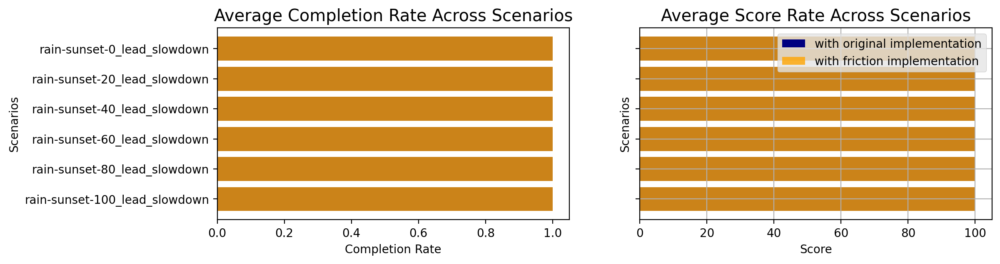

In [32]:
friction_legend = ["with original implementation", "with friction implementation"]

plt.subplots(1, 2, sharey=True, figsize=(12,3), dpi=200)
plt.gca().invert_yaxis()
width = 0.25

plt.subplot(1, 2, 1)
plt.style.use('ggplot')
plt.barh(subfolders, avg_complete_orig, label=friction_legend[0], color="navy")
plt.barh(subfolders, avg_complete_fric, label=friction_legend[1], color="orange" , alpha = 0.8)
plt.title('Average Completion Rate Across Scenarios')
plt.ylabel('Scenarios')
plt.xlabel('Completion Rate')


plt.subplot(1, 2, 2)
plt.style.use('ggplot')
plt.barh(subfolders, avg_score_orig, label=friction_legend[0], color="navy")
plt.barh(subfolders, avg_score_fric, label=friction_legend[1], color="orange" , alpha = 0.8)
plt.title('Average Score Rate Across Scenarios')
plt.ylabel('Scenarios')
plt.xlabel('Score')

plt.grid()

plt.legend()
plt.show()

## Comparison

In [33]:
attribute_order = ["x", "y", "v", "cvip", "steer", "brake", "throttle"]

all_medians = np.empty((len(txt_lists_fric), len(attribute_order), 2), dtype=object)
# [[[], []] * len(attribute_order)  for i in range(len(txt_lists_fric))]

all_medians

array([[[None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None]],

       [[None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None]],

       [[None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None]],

       [[None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None]],

       [[None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None]],

       [[None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None]]], dtype=object)

In [34]:
full_legend = subfolders.copy()

### x,y traces

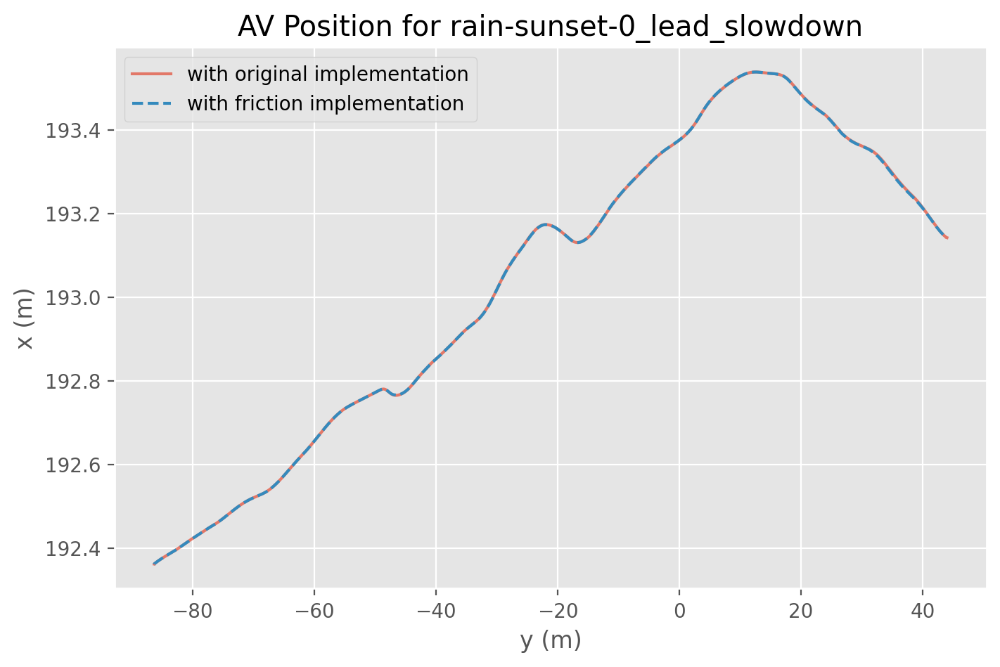

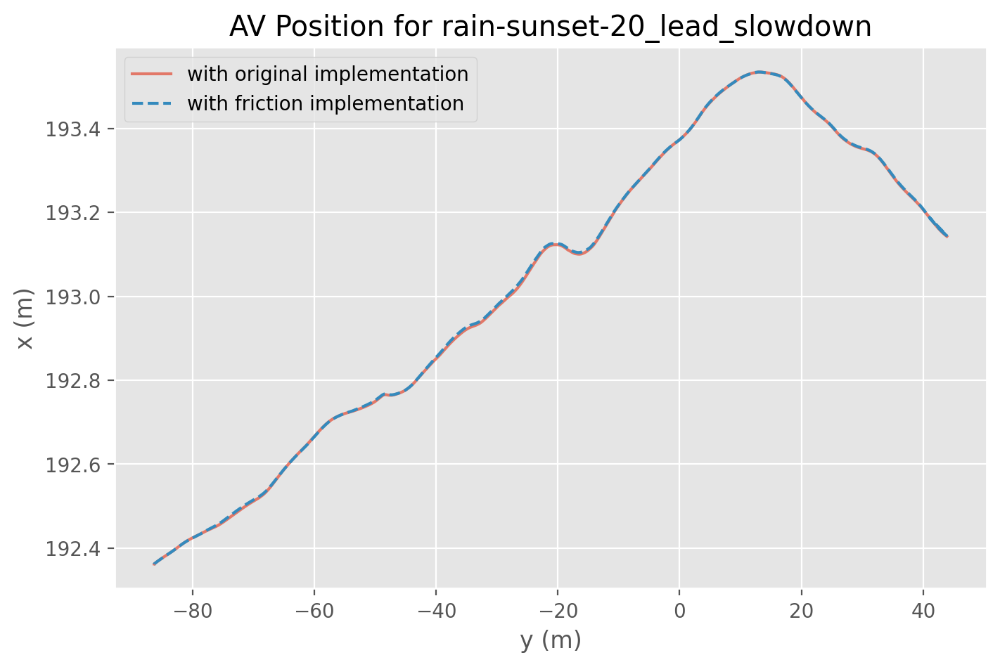

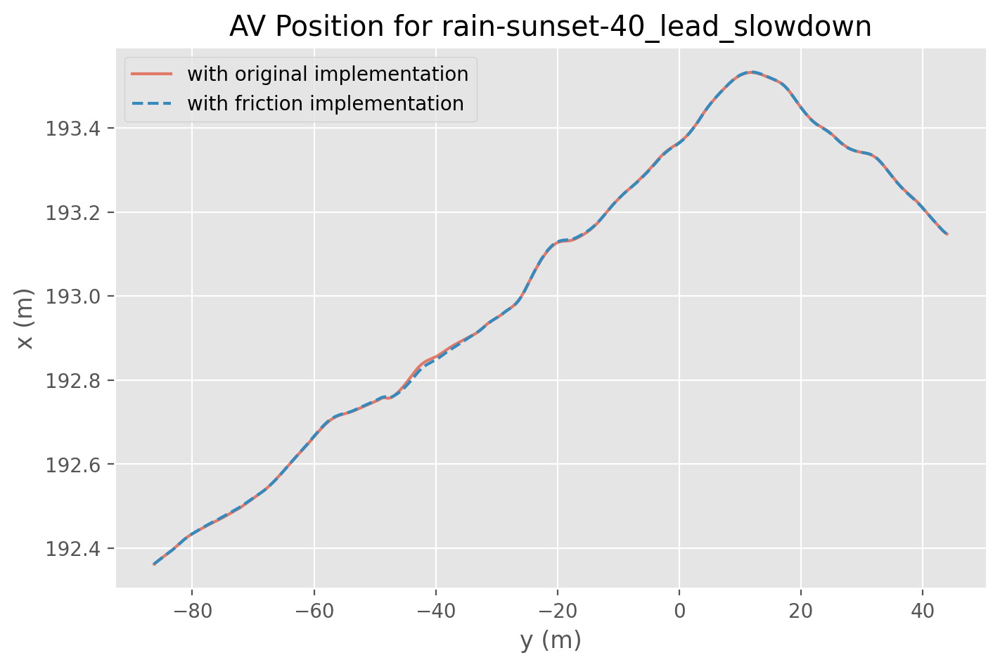

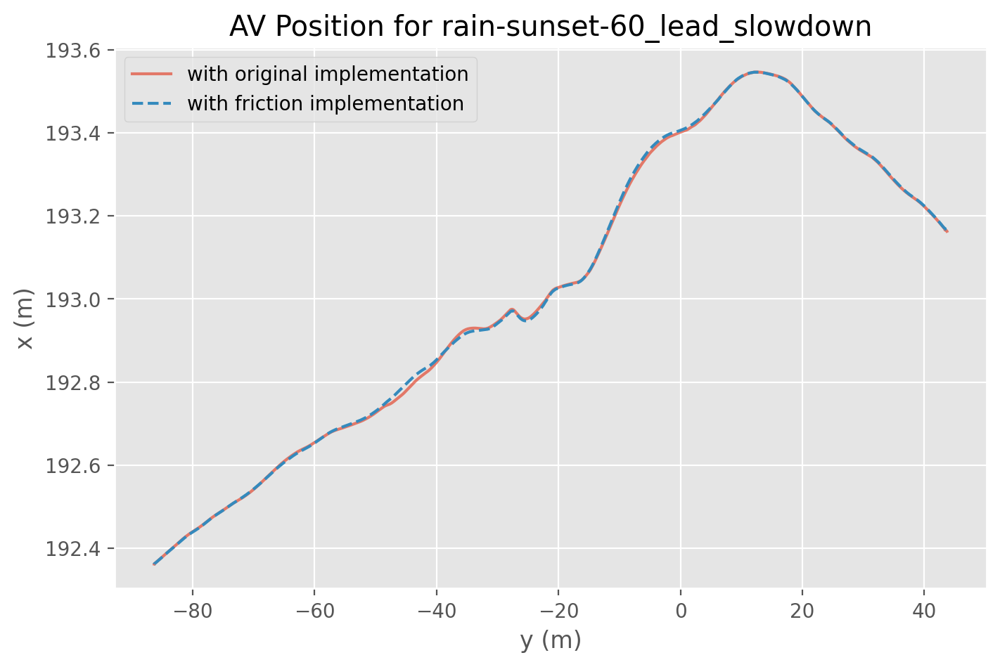

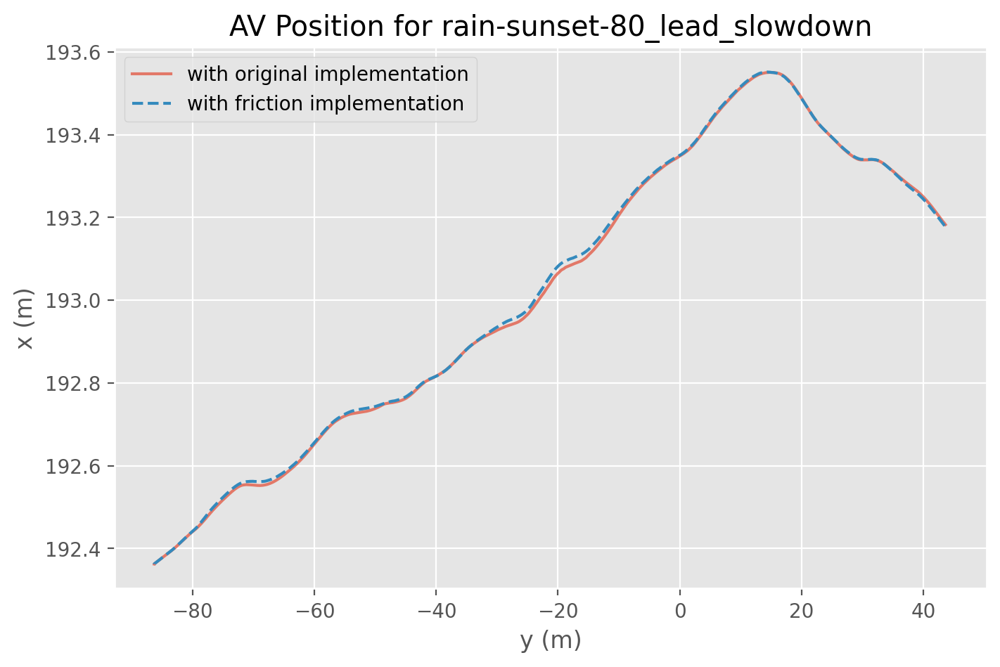

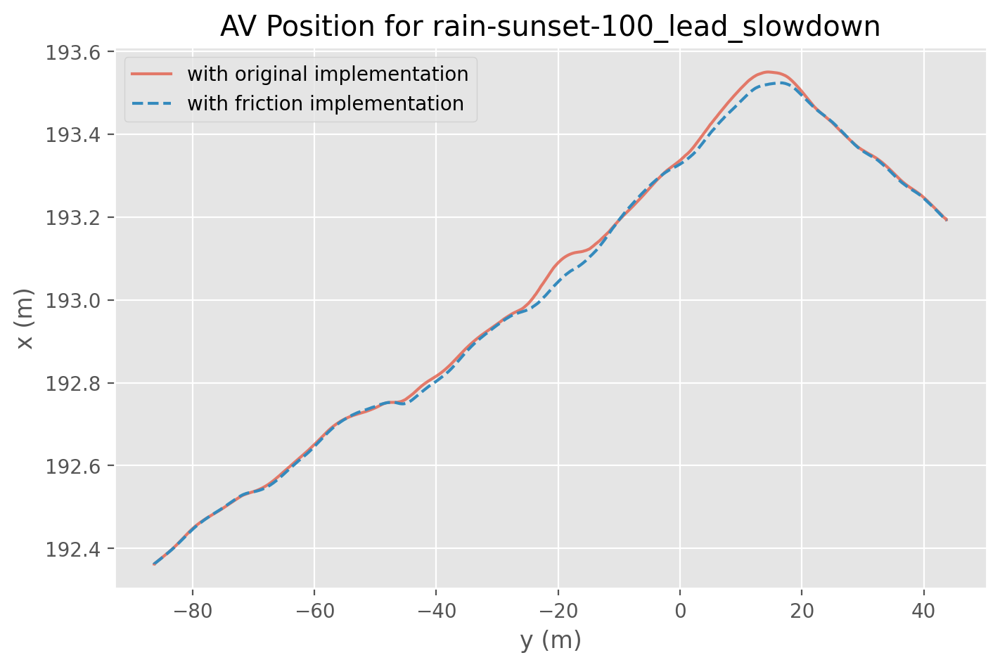

In [35]:
for weather in range(len(txt_lists_fric)):
    plt.figure(figsize=(8,5), dpi=200)
    df_orig_x = pd.DataFrame()
    df_orig_y = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['x'].dtypes == 'object' or df_array_orig[weather][i]['y'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_orig[weather][i]['x'].isnull().values.any() and not df_array_orig[weather][i]['y'].isnull().values.any():
                df_orig_x["Run"+str(i)] = df_array_orig[weather][i]['x']
                df_orig_y["Run"+str(i)] = df_array_orig[weather][i]['y']

    median_orig_x = df_orig_x.median(axis=1)
    median_orig_y = df_orig_y.median(axis=1)

    plt.plot(median_orig_y, median_orig_x, alpha=0.7)


    df_fric_x = pd.DataFrame()
    df_fric_y = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['x'].dtypes == 'object' or df_array_fric[weather][i]['y'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['x'].isnull().values.any() and not df_array_fric[weather][i]['y'].isnull().values.any():
                df_fric_x["Run"+str(i)] = df_array_fric[weather][i]['x']
                df_fric_y["Run"+str(i)] = df_array_fric[weather][i]['y']

    median_fric_x = df_fric_x.median(axis=1)
    median_fric_y = df_fric_y.median(axis=1)

    
    all_medians[weather][0][0] = median_orig_x
    all_medians[weather][0][1] = median_fric_x
    all_medians[weather][1][0] = median_orig_y
    all_medians[weather][1][1] = median_fric_y
    
    plt.plot(median_fric_y, median_fric_x, '--')
    plt.xlabel("y (m)")
    plt.ylabel("x (m)")
    
    plt.title("AV Position for " + subfolders[weather])
    plt.legend(friction_legend)
    plt.show()
    

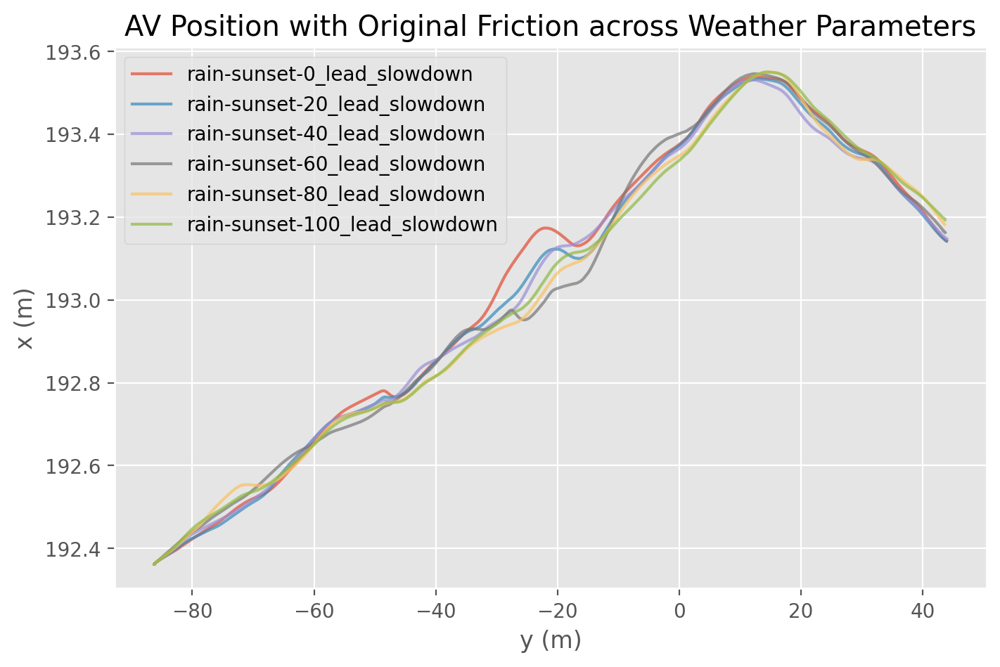

In [36]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):
    df_orig_x = pd.DataFrame()
    df_orig_y = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['x'].dtypes == 'object' or df_array_orig[weather][i]['y'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_orig[weather][i]['x'].isnull().values.any() and not df_array_orig[weather][i]['y'].isnull().values.any():
                df_orig_x["Run"+str(i)] = df_array_orig[weather][i]['x']
                df_orig_y["Run"+str(i)] = df_array_orig[weather][i]['y']

    median_orig_x = df_orig_x.median(axis=1)
    median_orig_y = df_orig_y.median(axis=1)

    plt.plot(median_orig_y, median_orig_x, alpha=0.7)

    
# plt.axis('equal')
plt.xlabel("y (m)")
plt.ylabel("x (m)")
plt.title("AV Position with Original Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

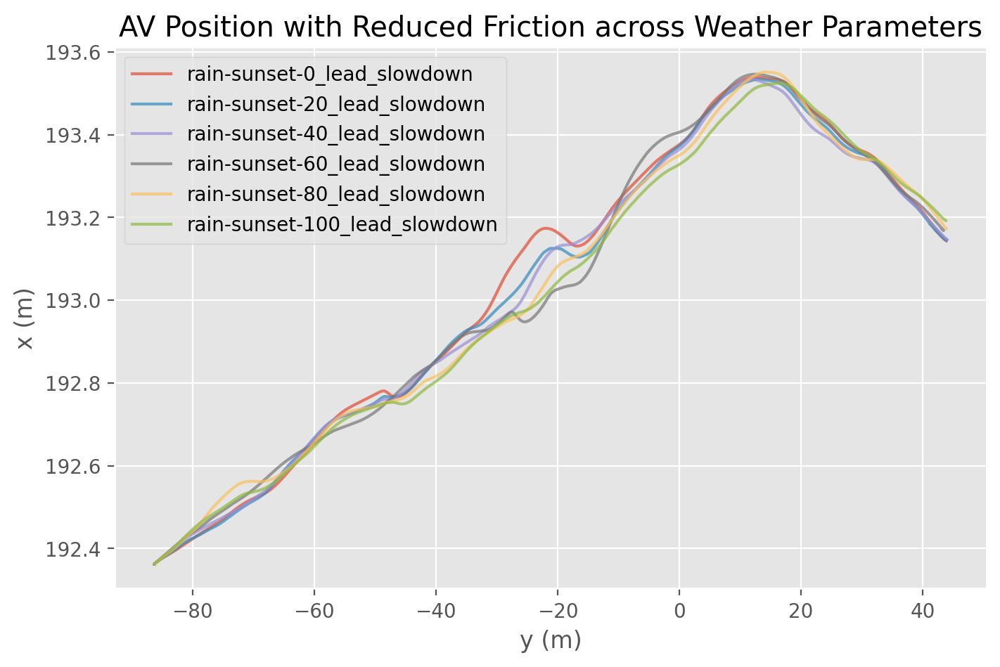

In [37]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):

    df_fric_x = pd.DataFrame()
    df_fric_y = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['x'].dtypes == 'object' or df_array_fric[weather][i]['y'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['x'].isnull().values.any() and not df_array_fric[weather][i]['y'].isnull().values.any():
                df_fric_x["Run"+str(i)] = df_array_fric[weather][i]['x']
                df_fric_y["Run"+str(i)] = df_array_fric[weather][i]['y']

    median_fric_x = df_fric_x.median(axis=1)
    median_fric_y = df_fric_y.median(axis=1)

    plt.plot(median_fric_y, median_fric_x, alpha=0.7)
    
# plt.axis('equal')
plt.xlabel("y (m)")
plt.ylabel("x (m)")
plt.title("AV Position with Reduced Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

### v

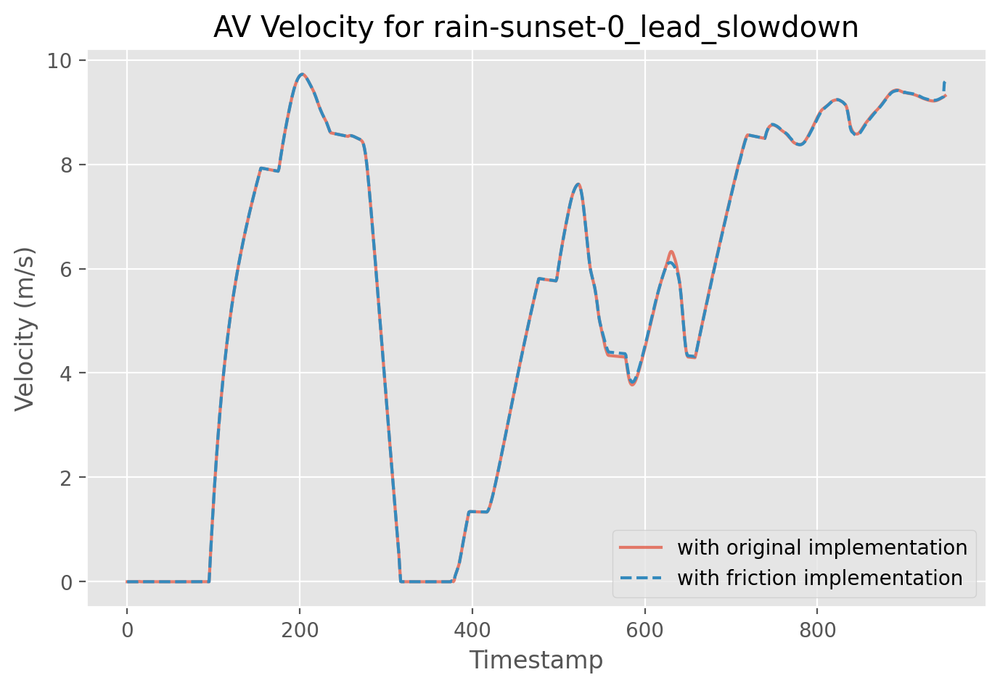

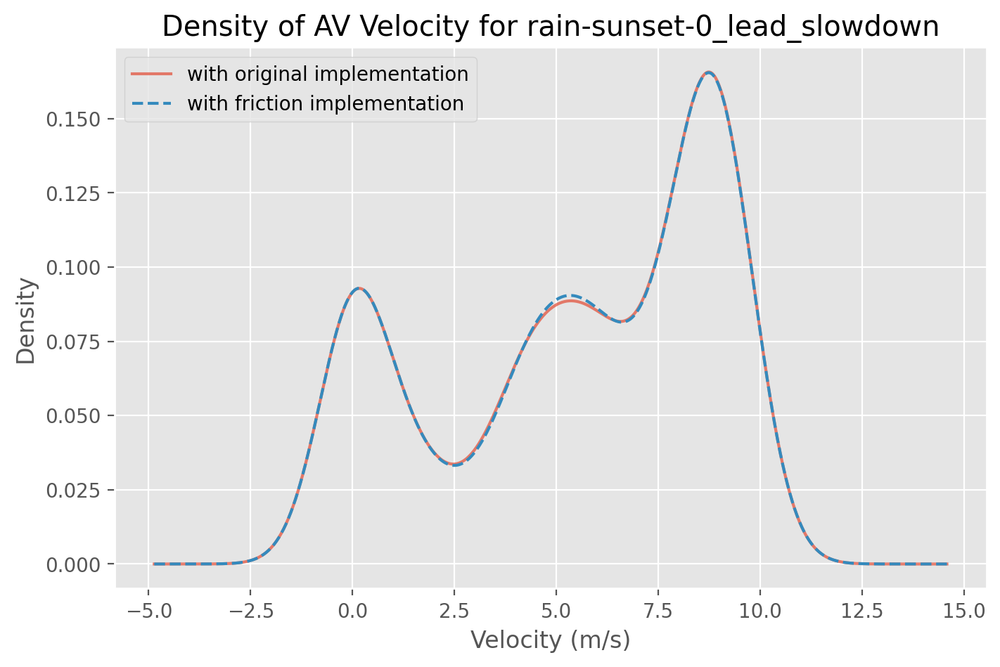

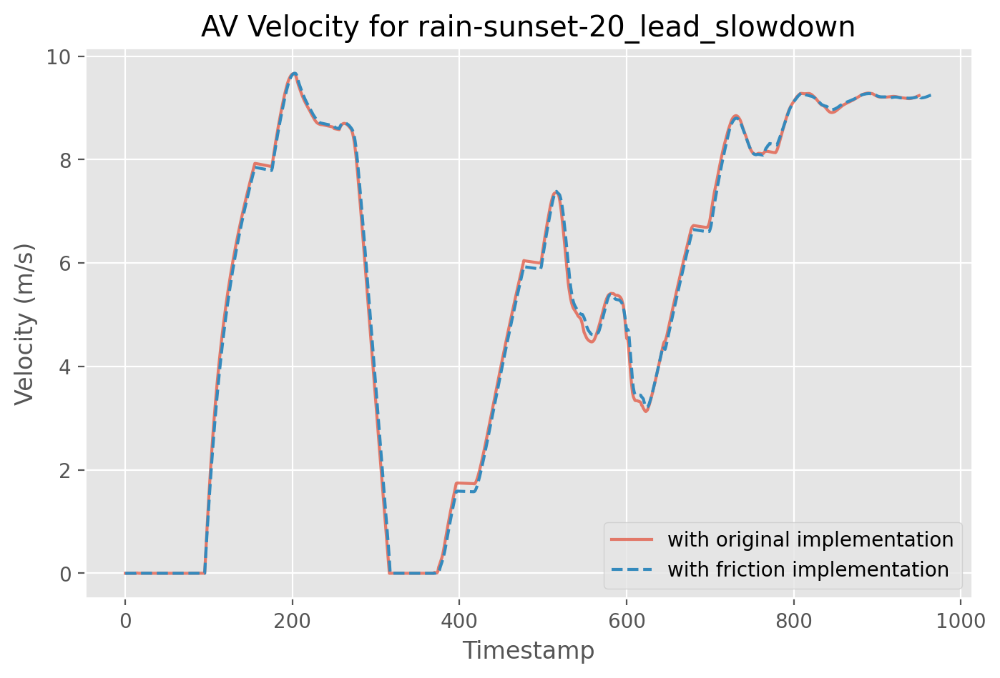

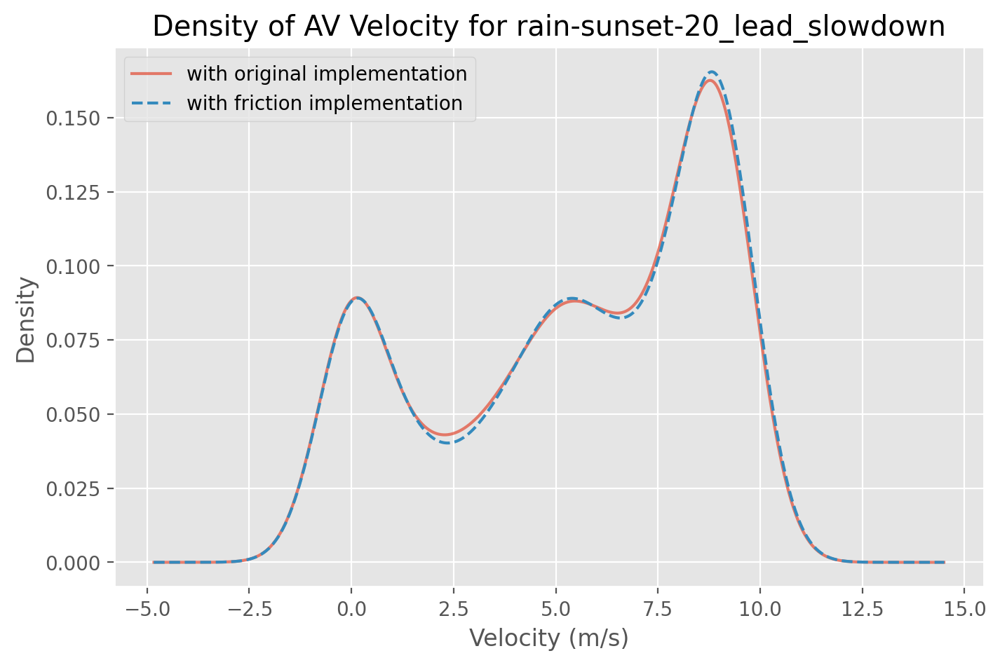

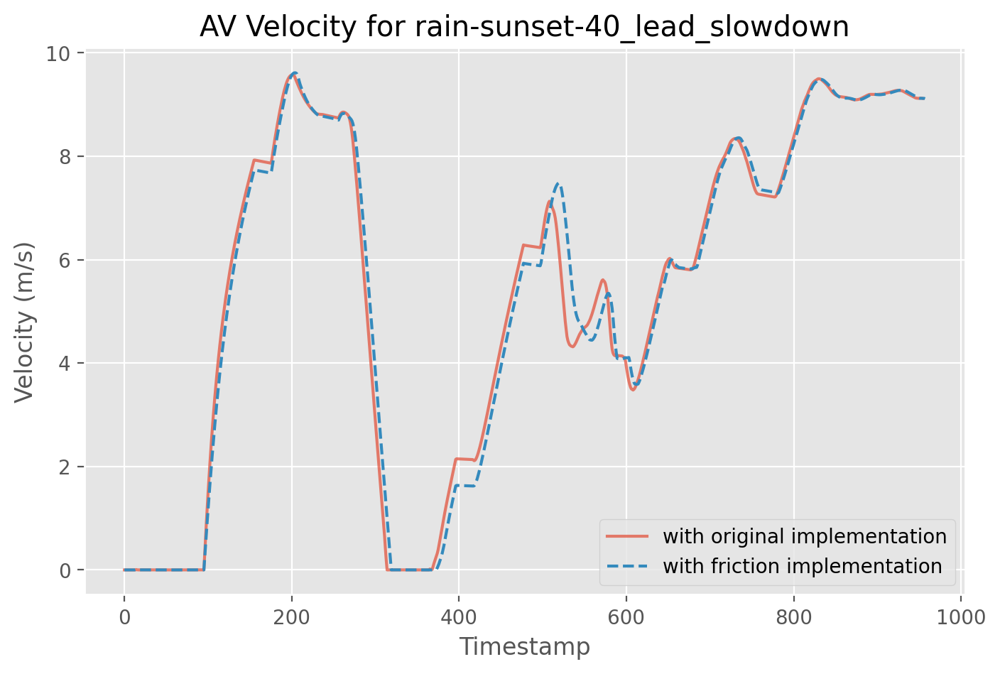

...

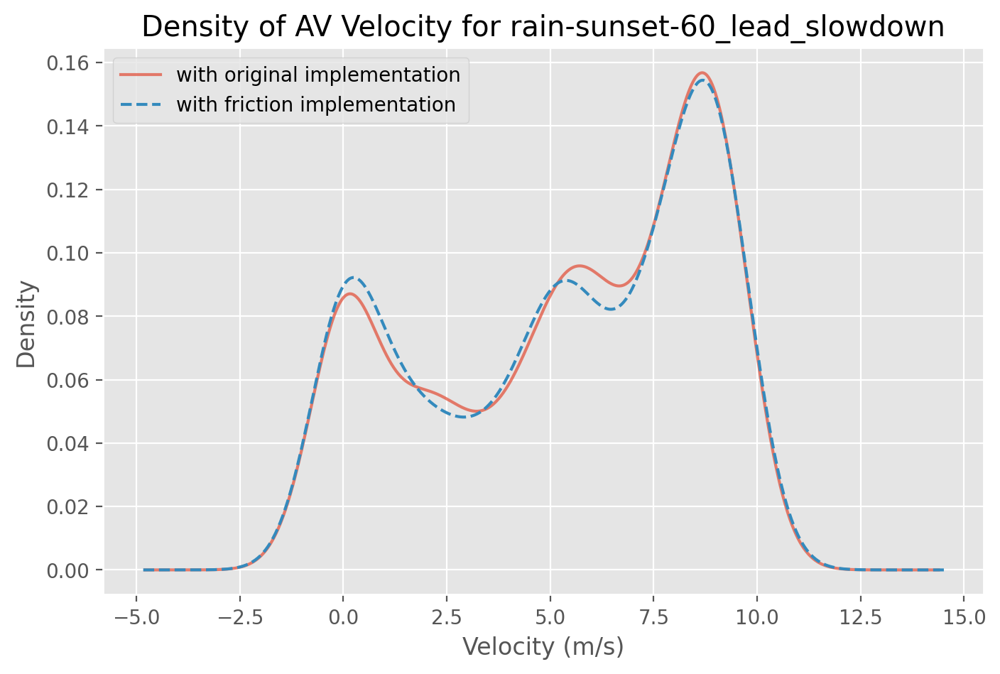

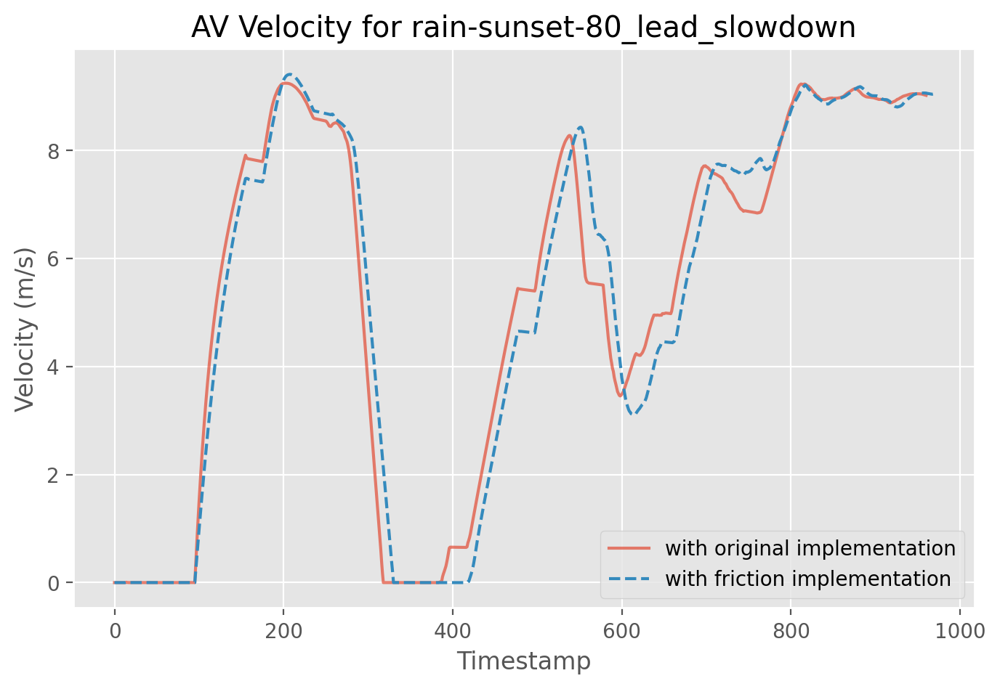

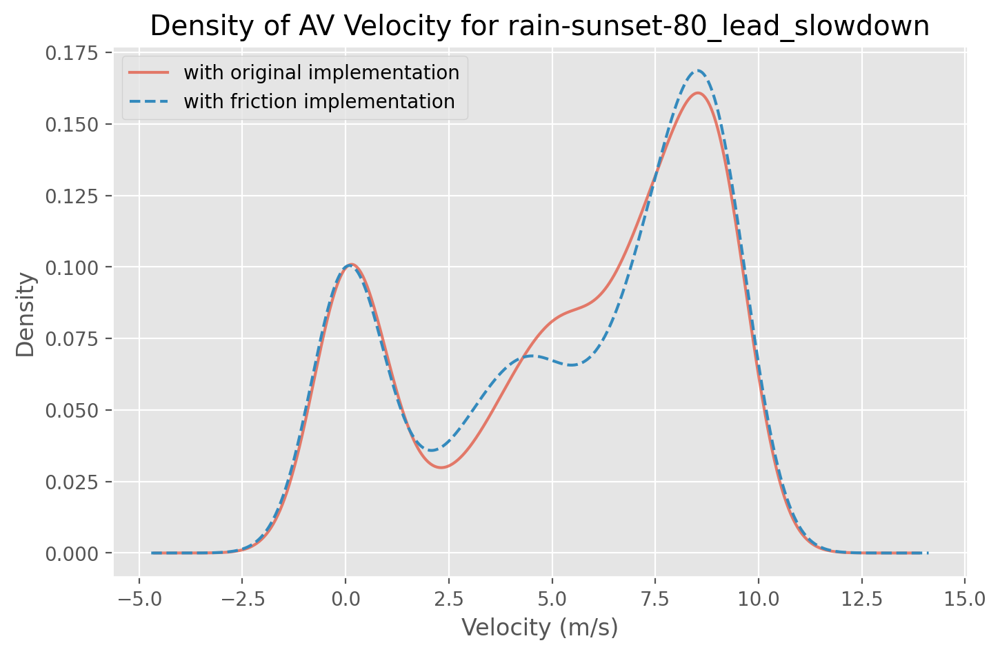

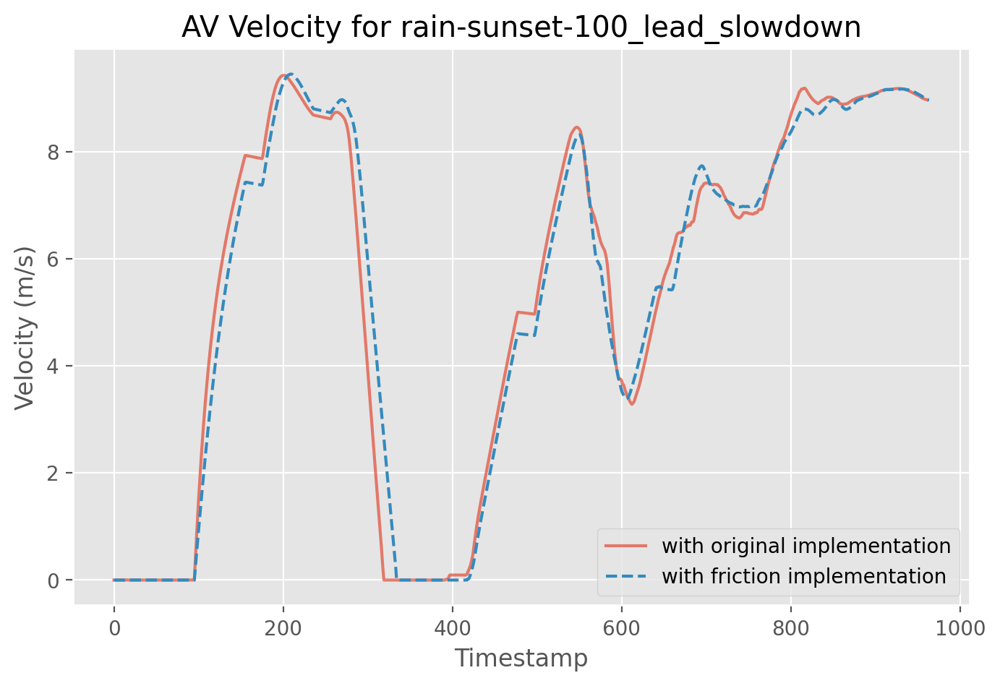

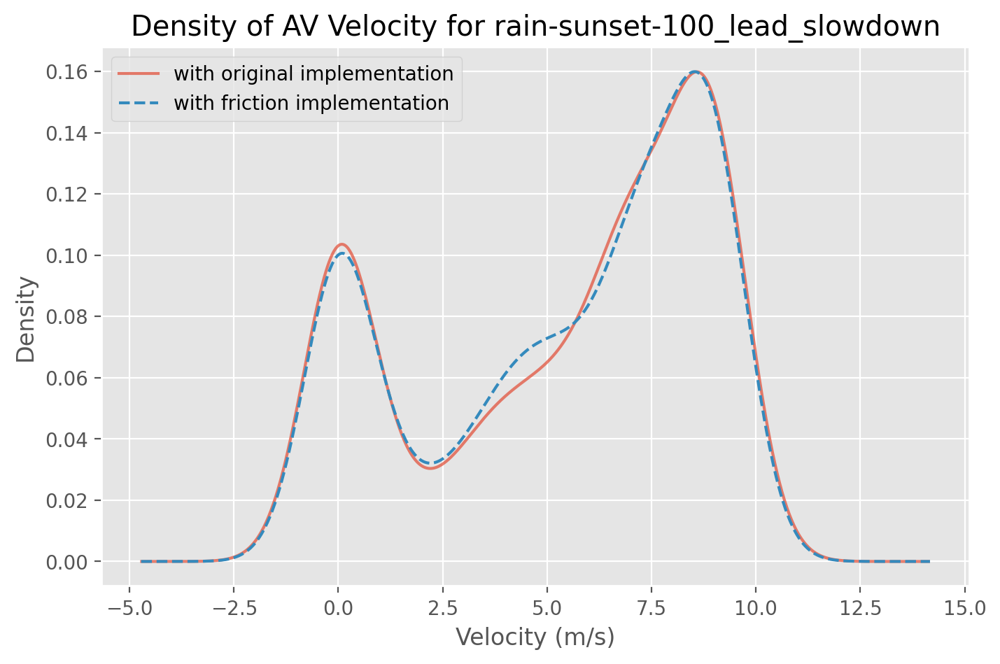

In [38]:
for weather in range(len(txt_lists_fric)):
    plt.figure(figsize=(8,5), dpi=200)
    df_orig_v = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['v'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_orig[weather][i]['v'].isnull().values.any():
                df_orig_v["Run"+str(i)] = df_array_orig[weather][i]['v']

    median_orig_v = df_orig_v.median(axis=1)

    plt.plot(median_orig_v, alpha=0.7)


    df_fric_v = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['v'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['v'].isnull().values.any():
                df_fric_v["Run"+str(i)] = df_array_fric[weather][i]['v']

    median_fric_v = df_fric_v.median(axis=1)
    
    all_medians[weather][2][0] = median_orig_v
    all_medians[weather][2][1] = median_fric_v
    
    plt.plot(median_fric_v, '--')
    
    plt.title(subfolders[weather])
    plt.legend(friction_legend)
    plt.xlabel("Timestamp")
    plt.ylabel("Velocity (m/s)")
    plt.title("AV Velocity for " + subfolders[weather])
    plt.show()
    
    plt.figure(figsize=(8,5), dpi=200)
    plt.xlabel("Velocity (m/s)")
    plt.ylabel("Density")
    median_orig_v.plot.density(alpha=0.7)
    median_fric_v.plot.density(style='--')
    plt.title("Density of AV Velocity for " + subfolders[weather])
    plt.legend(friction_legend)
    plt.show()
    

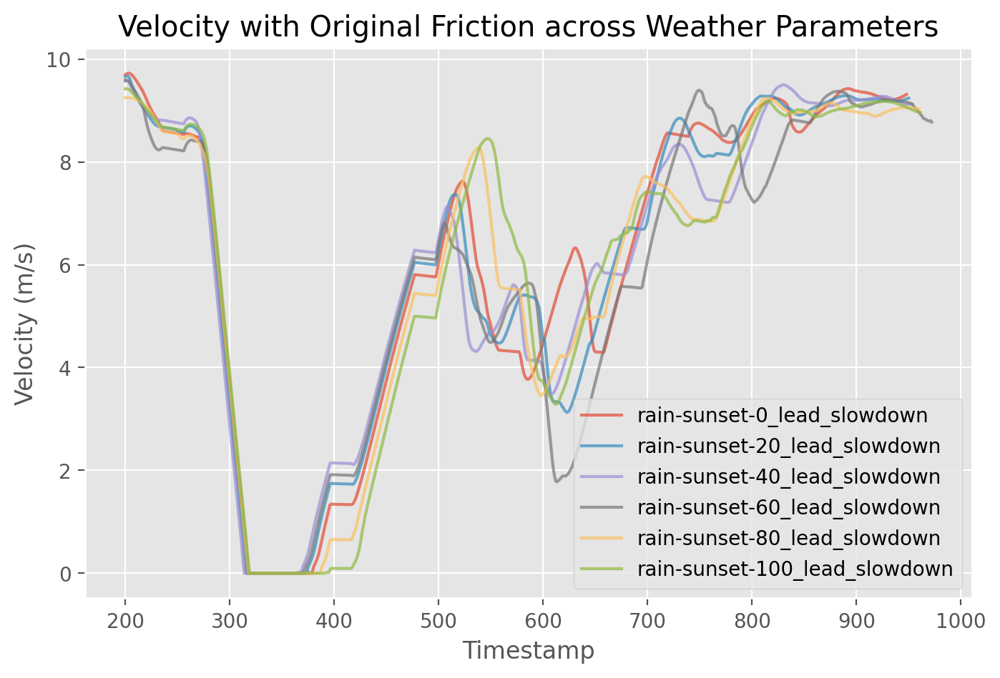

In [39]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):
    
    df_orig_v = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['v'].dtypes == 'v'):
            print(i)
        else:
            if not df_array_orig[weather][i]['v'].isnull().values.any():
                df_orig_v["Run"+str(i)] = df_array_orig[weather][i]['v']

    median_orig_v = df_orig_v.median(axis=1)


    plt.plot(median_orig_v[200:], alpha=0.7)


plt.xlabel("Timestamp")
plt.ylabel("Velocity (m/s)")
plt.title("Velocity with Original Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

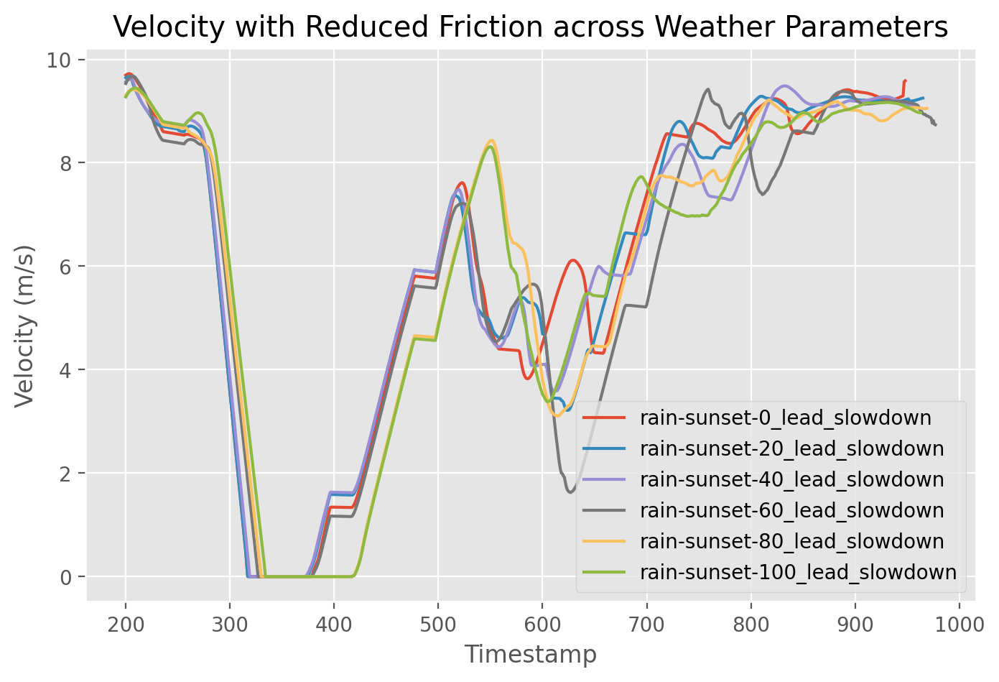

In [40]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):

    df_fric_v = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['v'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['v'].isnull().values.any() :
                df_fric_v["Run"+str(i)] = df_array_fric[weather][i]['v']

    median_fric_v = df_fric_v.median(axis=1)

    plt.plot(median_fric_v[200:])

    # plt.axis('equal')
plt.xlabel("Timestamp")
plt.ylabel("Velocity (m/s)")
plt.title("Velocity with Reduced Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

### cvip

0      502.132203
1      502.126136
2      502.120028
3      502.113942
4      502.107849
          ...    
944     26.013267
945     26.075086
946     26.140043
947     26.258482
948     26.408299
Length: 949, dtype: float64


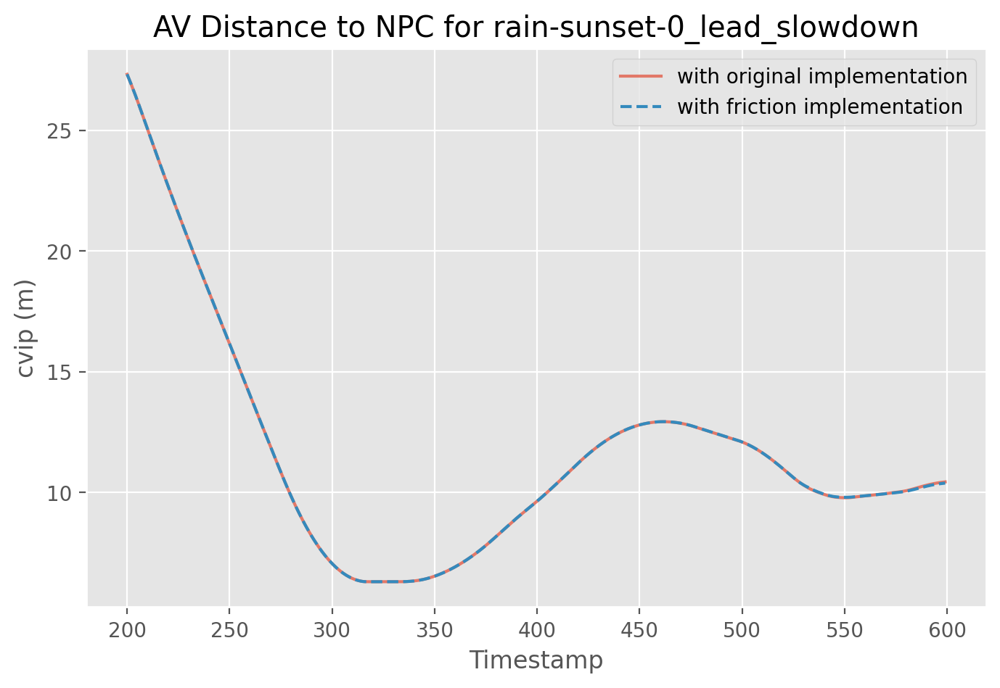

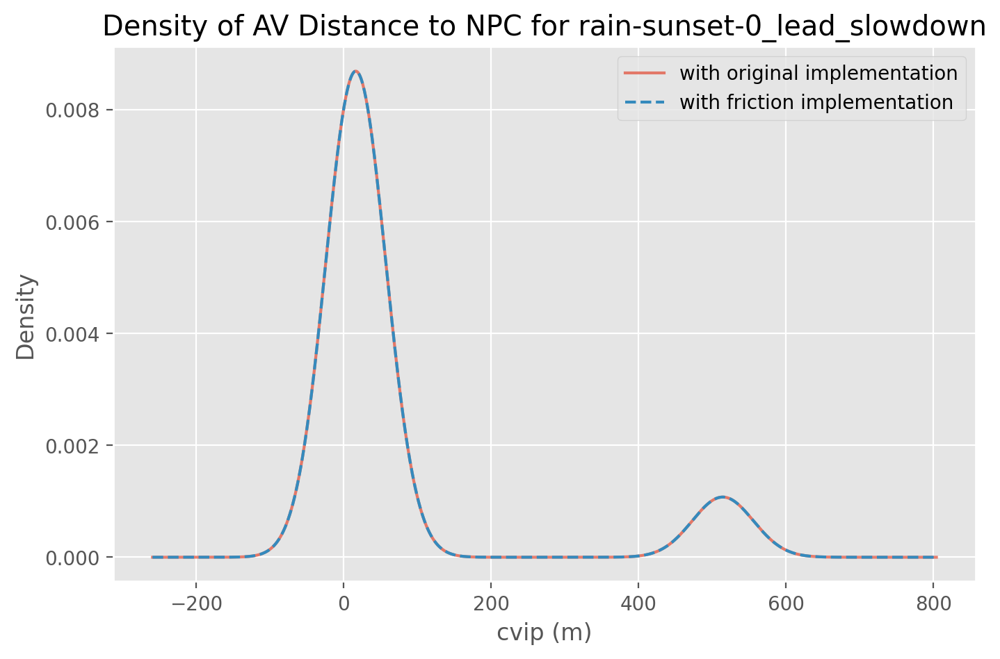

0      502.132203
1      502.126136
2      502.120028
3      502.113942
4      502.107849
          ...    
961     30.840601
962     30.907825
963     30.974910
964     31.041873
965     31.130923
Length: 966, dtype: float64


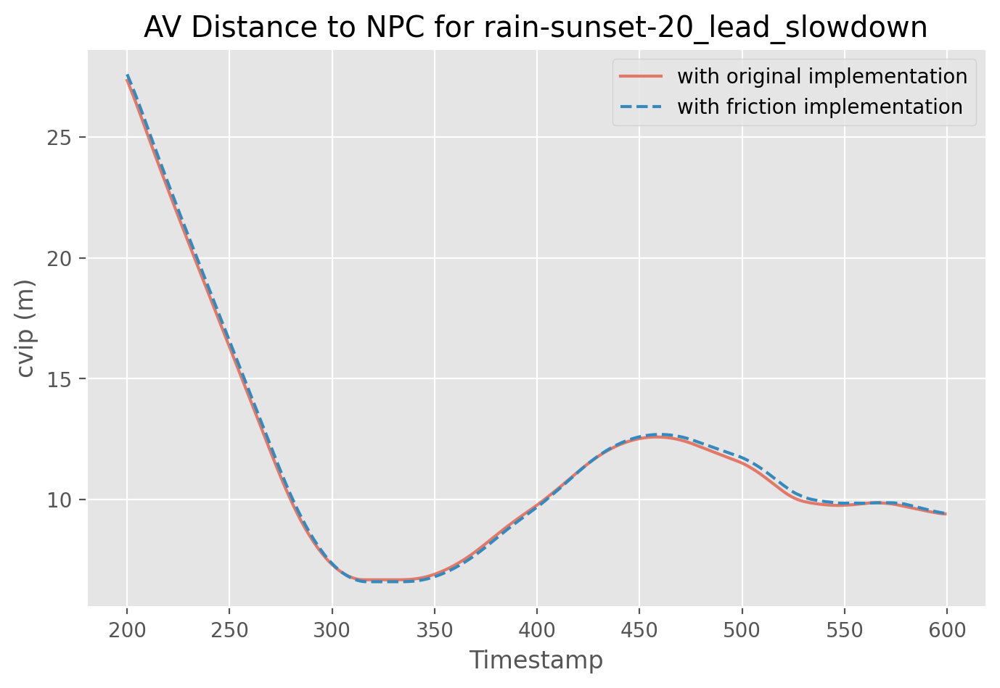

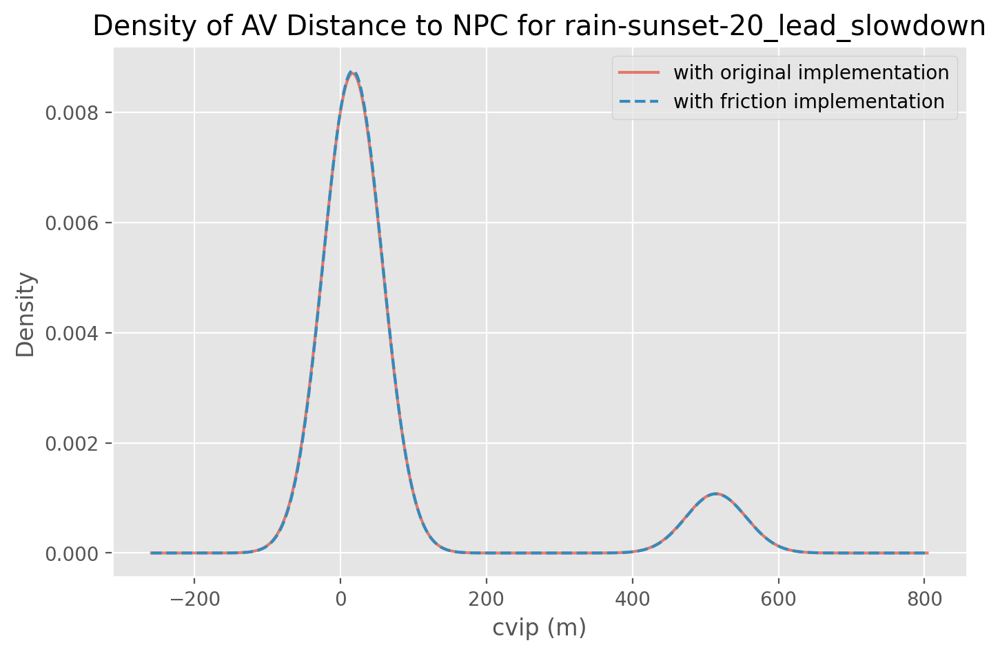

0      502.132203
1      502.126136
2      502.120028
3      502.113942
4      502.107849
          ...    
953     27.676818
954     27.749834
955     27.830039
956     27.909932
957     28.021129
Length: 958, dtype: float64


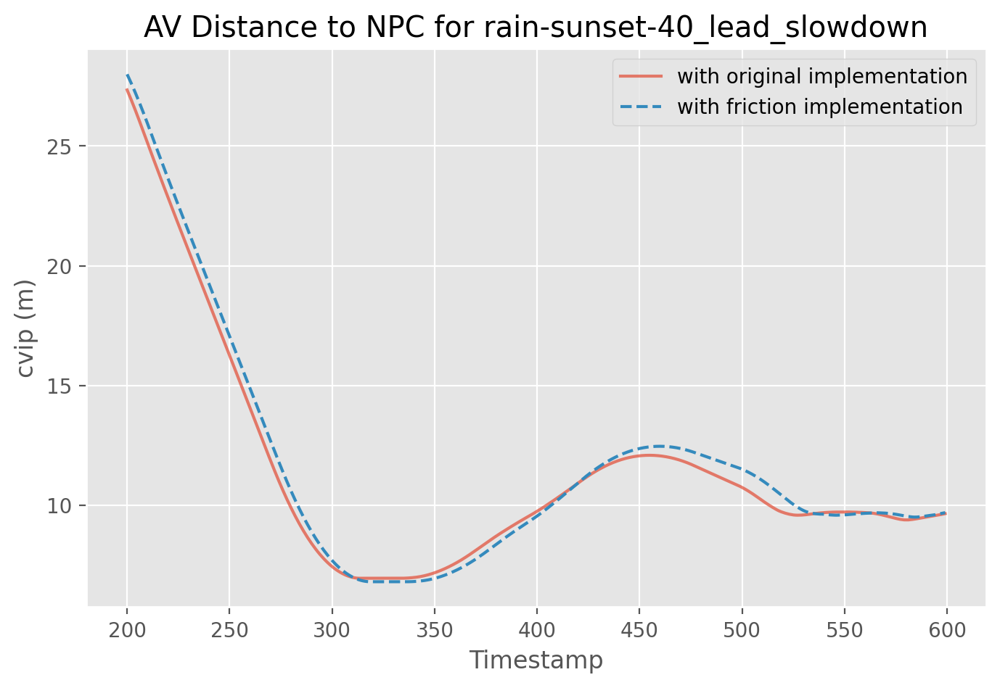

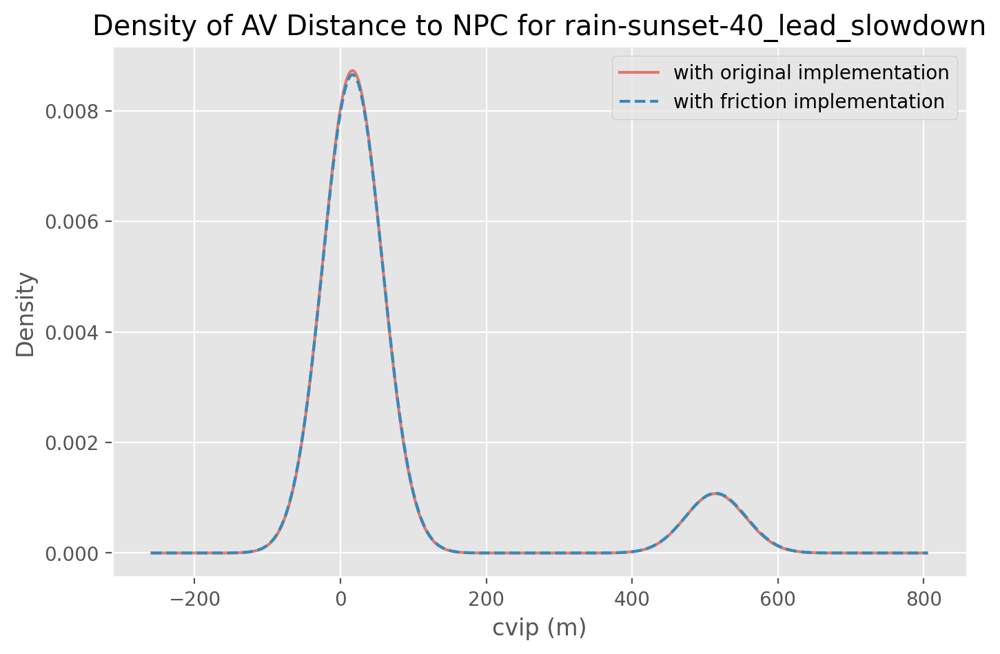

0      502.132203
1      502.126136
2      502.120028
3      502.113942
4      502.107849
          ...    
973     33.396737
974     33.528582
975     33.657247
976     33.933767
977     34.488412
Length: 978, dtype: float64


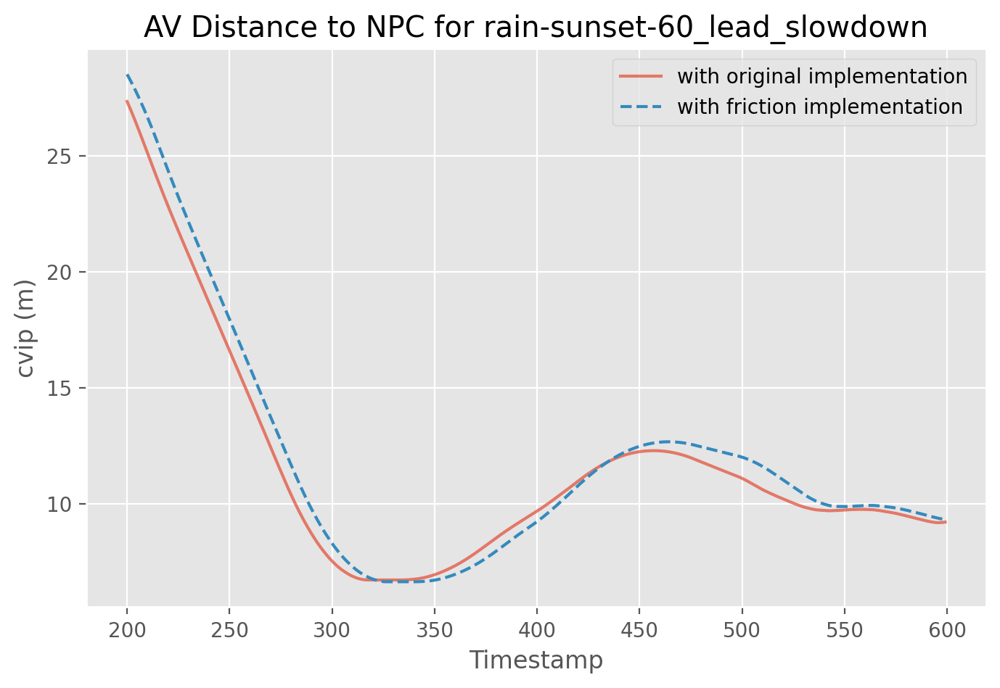

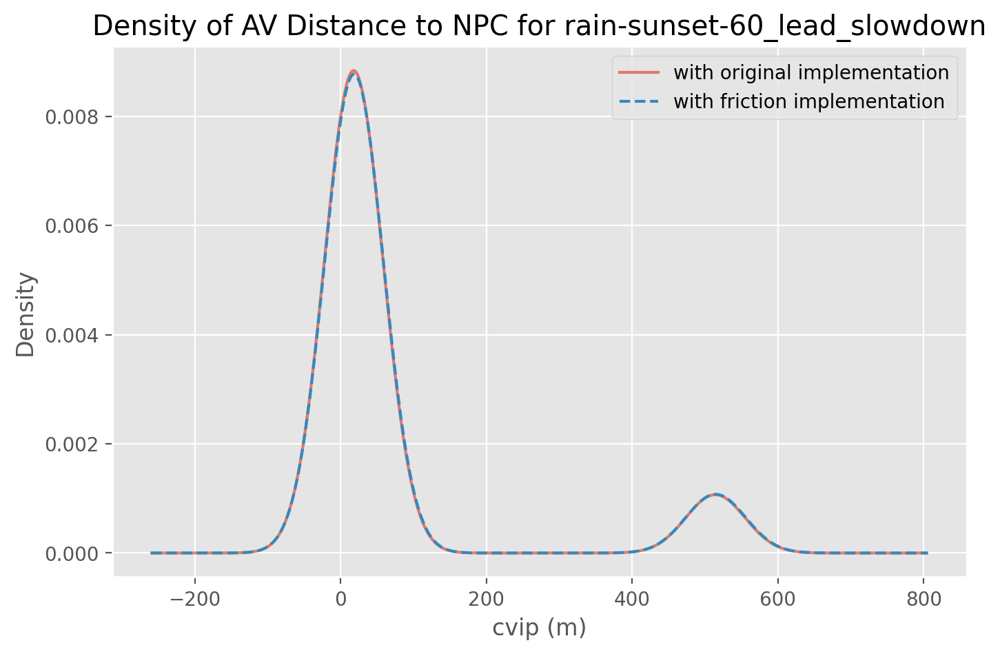

0      502.132203
1      502.126136
2      502.120028
3      502.113942
4      502.107849
          ...    
965     30.123067
966     30.244427
967     30.397055
968     30.583483
969     30.779711
Length: 970, dtype: float64


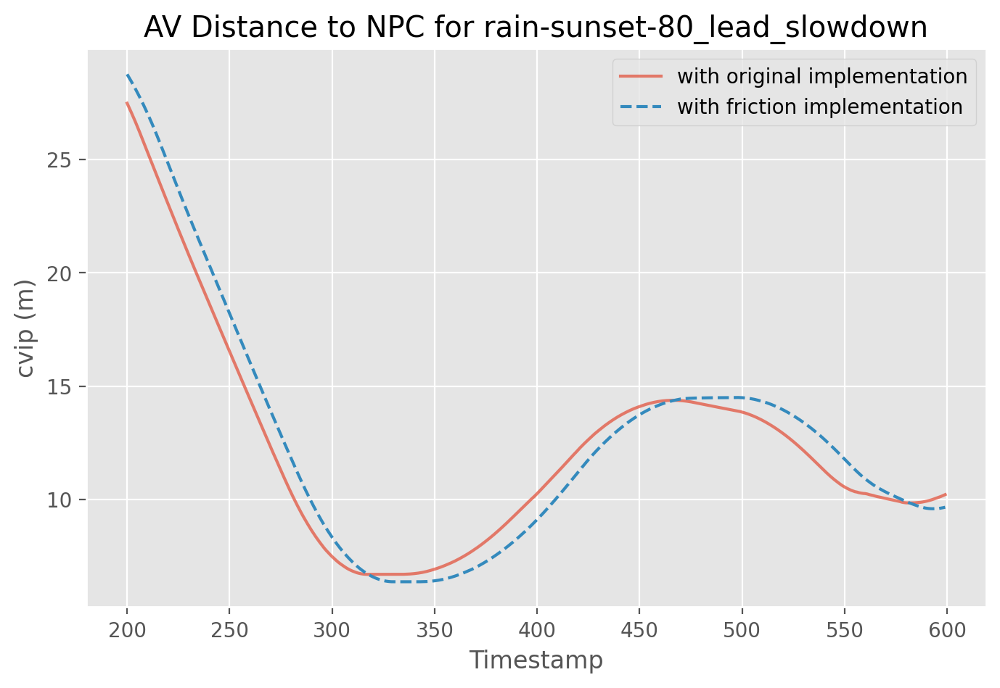

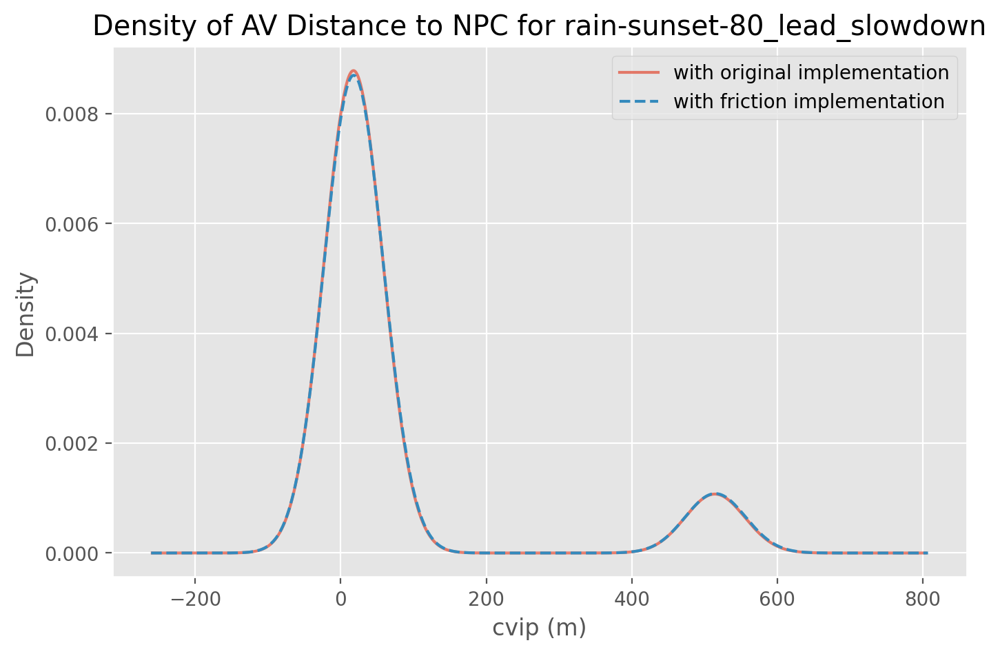

0      502.132203
1      502.126136
2      502.120028
3      502.113942
4      502.107849
          ...    
959     28.590849
960     28.664259
961     28.742255
962     28.838804
963     28.980762
Length: 964, dtype: float64


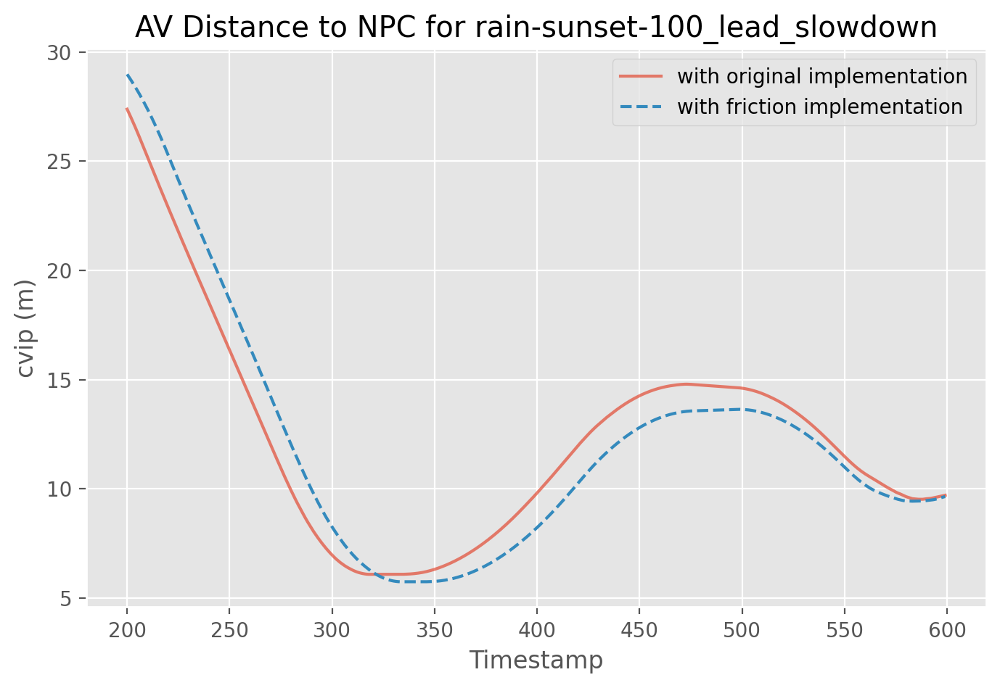

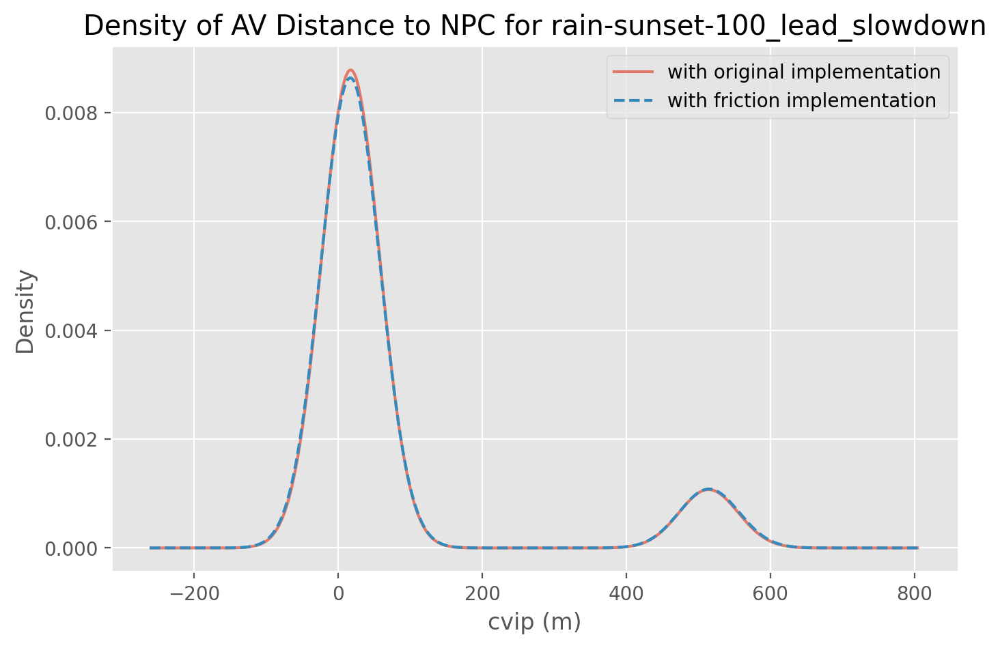

In [41]:
for weather in range(len(txt_lists_fric)):
    plt.figure(figsize=(8,5), dpi=200)
    df_orig_cvip = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['cvip'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_orig[weather][i]['cvip'].isnull().values.any():
                df_orig_cvip["Run"+str(i)] = df_array_orig[weather][i]['cvip']

    median_orig_cvip = df_orig_cvip.median(axis=1)

    plt.plot(median_orig_cvip.iloc[200:600], alpha=0.7)


    df_fric_cvip = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['cvip'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['cvip'].isnull().values.any():
                df_fric_cvip["Run"+str(i)] = df_array_fric[weather][i]['cvip']

    median_fric_cvip = df_fric_cvip.median(axis=1)
    
    print(median_fric_cvip)
    
    all_medians[weather][3][0] = median_orig_cvip
    all_medians[weather][3][1] = median_fric_cvip
    
    plt.plot(median_fric_cvip.iloc[200:600], '--')
    
    plt.title(subfolders[weather])
    plt.legend(friction_legend)
    plt.xlabel("Timestamp")
    plt.ylabel("cvip (m)")
    plt.title("AV Distance to NPC for " + subfolders[weather])
    plt.show()
    
    plt.figure(figsize=(8,5), dpi=200)
    plt.xlabel("cvip (m)")
    plt.ylabel("Density")
    median_orig_cvip.plot.density(alpha=0.7)
    median_fric_cvip.plot.density(style='--')
    plt.title("Density of AV Distance to NPC for " + subfolders[weather])
    plt.legend(friction_legend)
    plt.show()

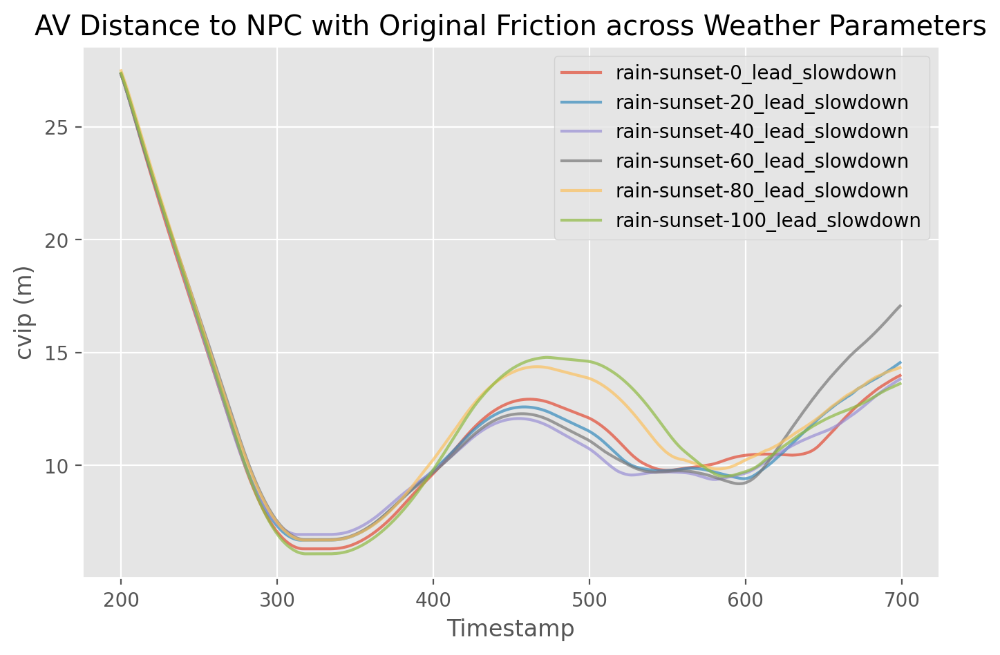

In [42]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):
    
    df_orig_cvip = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['cvip'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_orig[weather][i]['cvip'].isnull().values.any():
                df_orig_cvip["Run"+str(i)] = df_array_orig[weather][i]['cvip']

    median_orig_cvip = df_orig_cvip.median(axis=1)


    plt.plot(median_orig_cvip[200:700], alpha=0.7)



    # plt.axis('equal')
plt.xlabel("Timestamp")
plt.ylabel("cvip (m)")
plt.title("AV Distance to NPC with Original Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

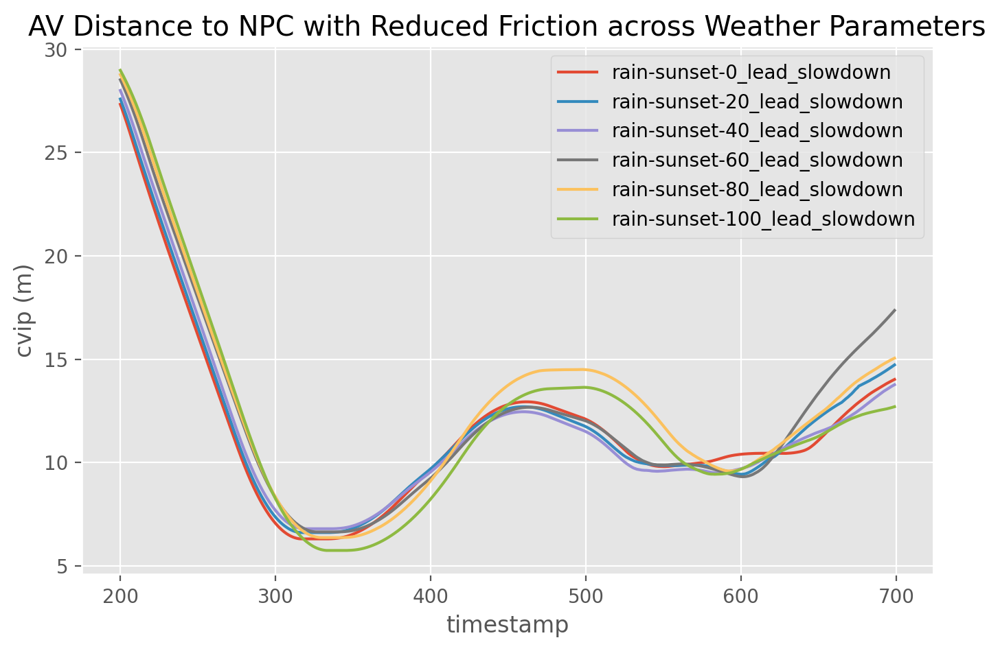

In [43]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):
    
    df_fric_cvip = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['cvip'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['cvip'].isnull().values.any() :
                df_fric_cvip["Run"+str(i)] = df_array_fric[weather][i]['cvip']

    median_fric_cvip = df_fric_cvip.median(axis=1)

    plt.plot(median_fric_cvip[200:700])

    # plt.axis('equal')
plt.xlabel("timestamp")
plt.ylabel("cvip (m)")
plt.title("AV Distance to NPC with Reduced Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

### steer

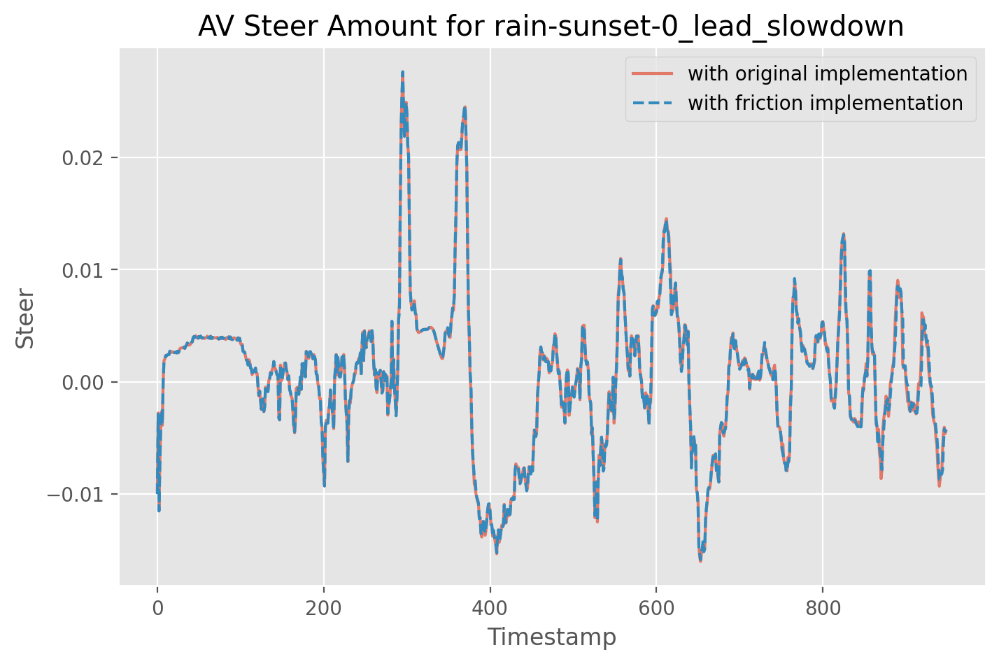

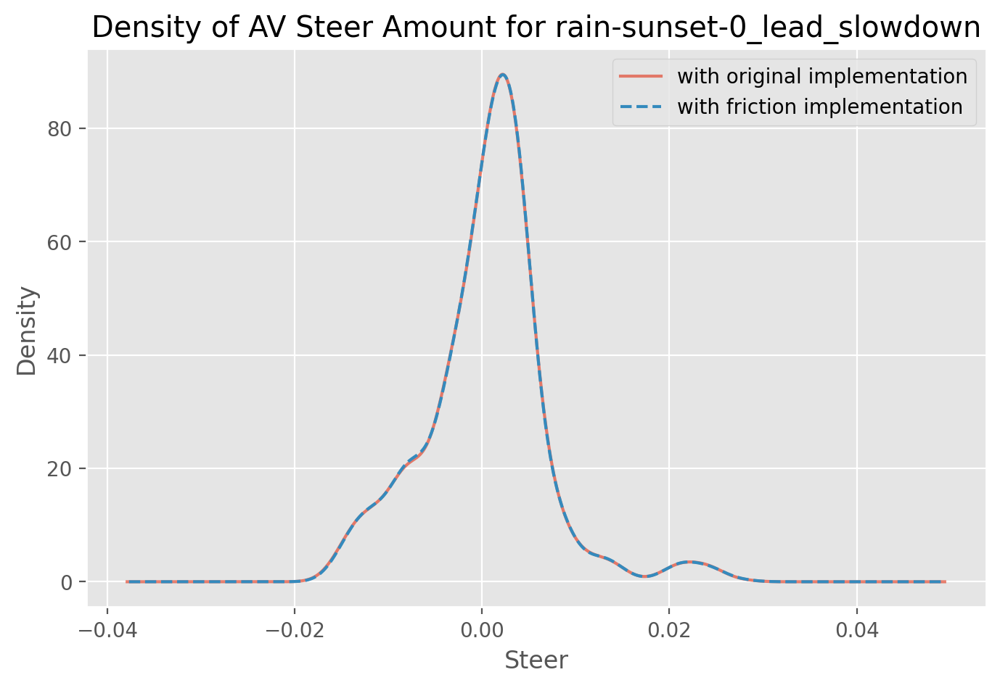

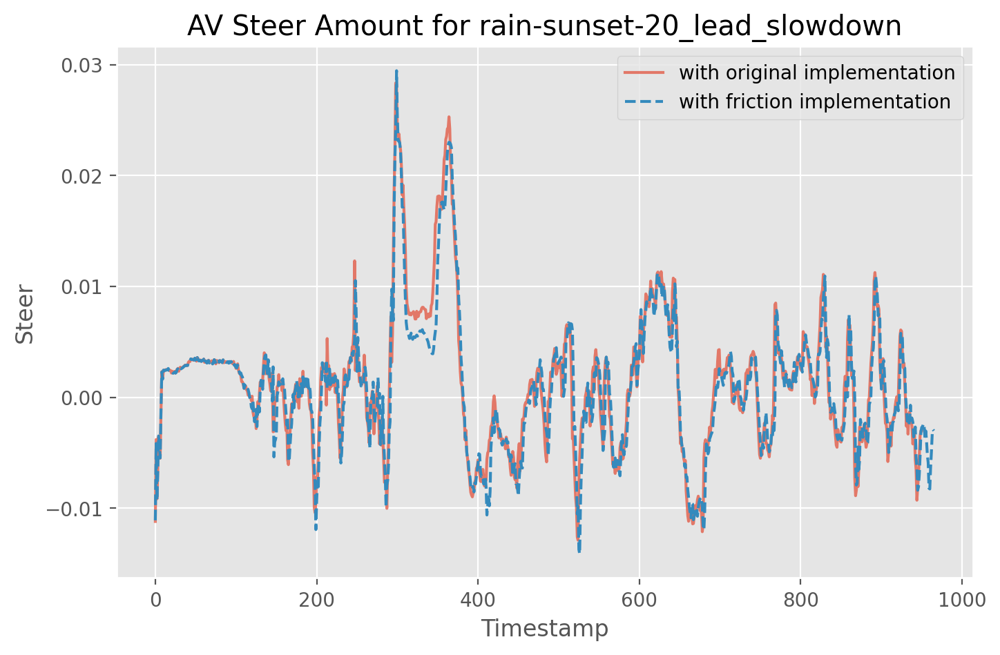

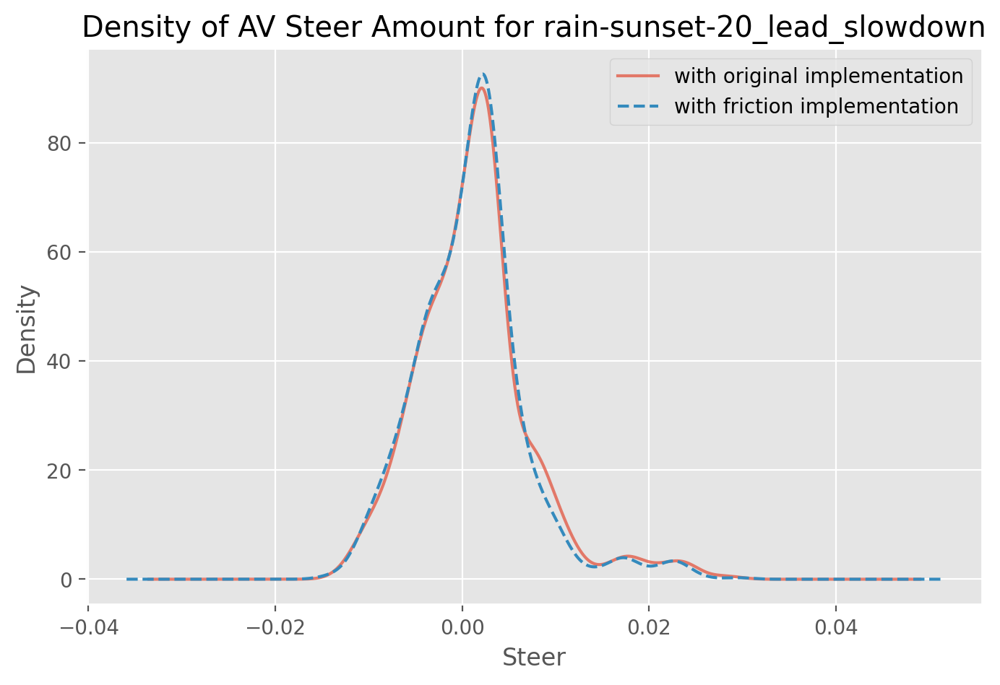

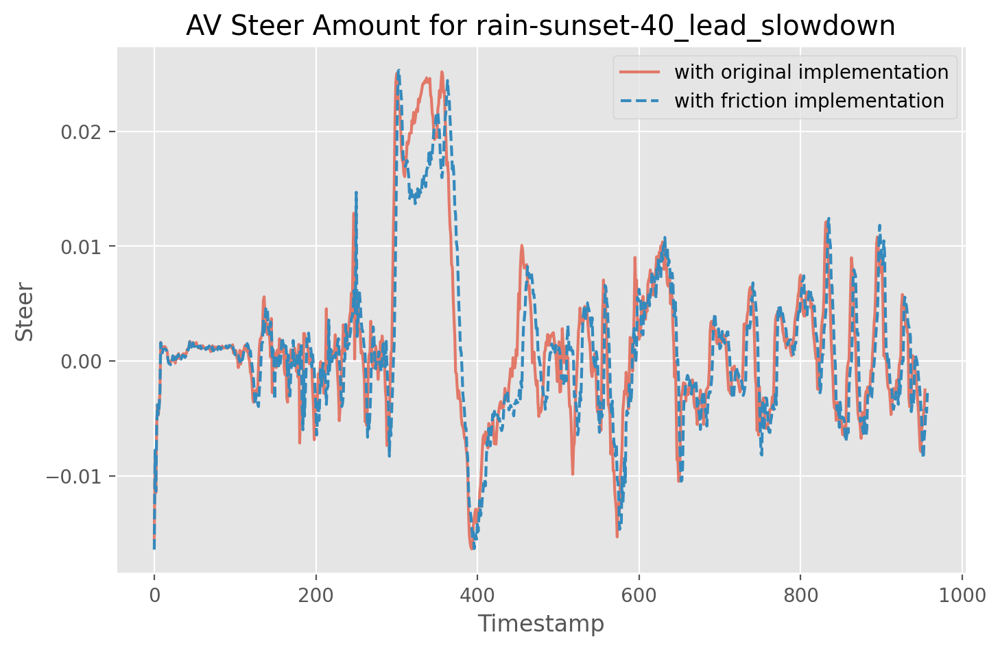

...

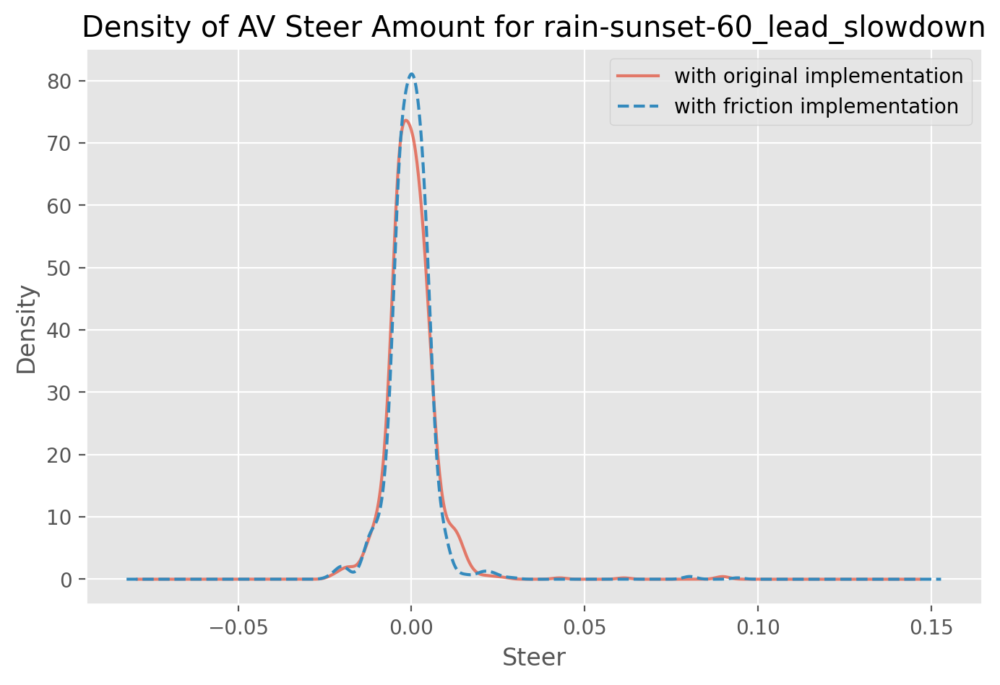

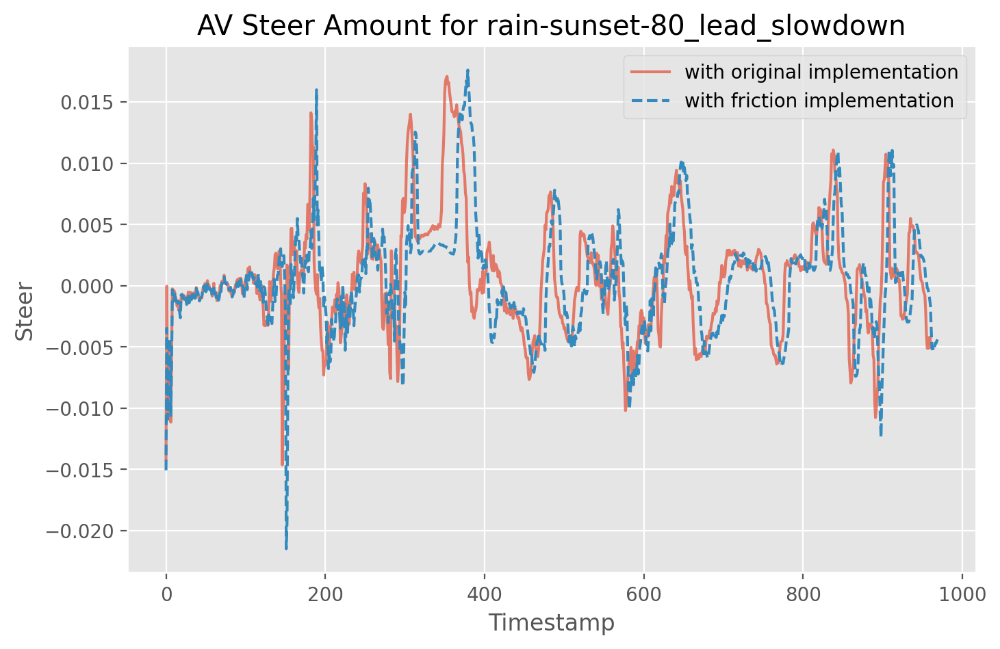

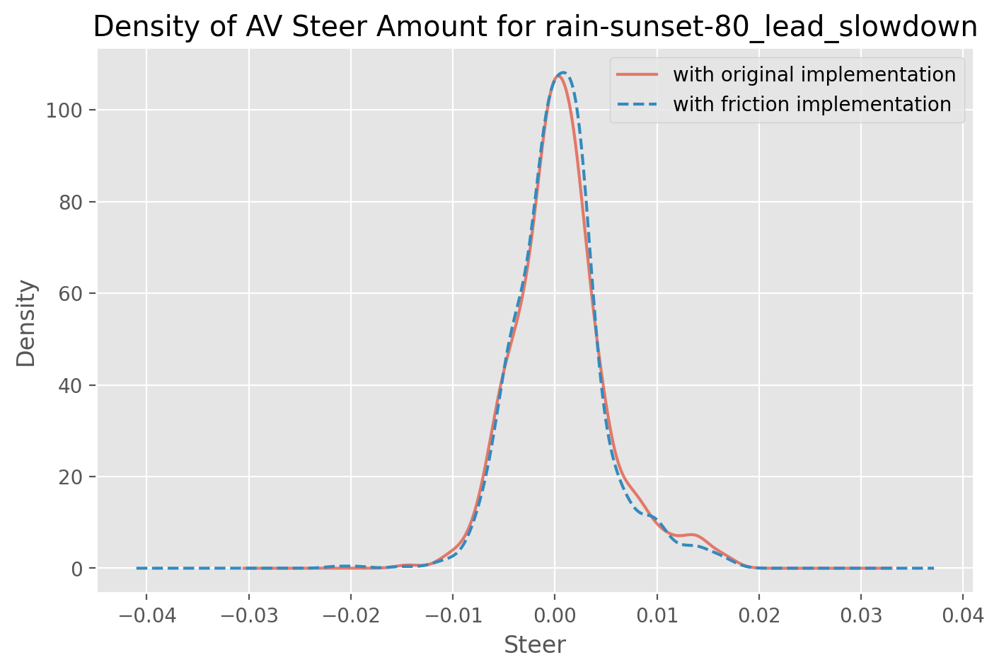

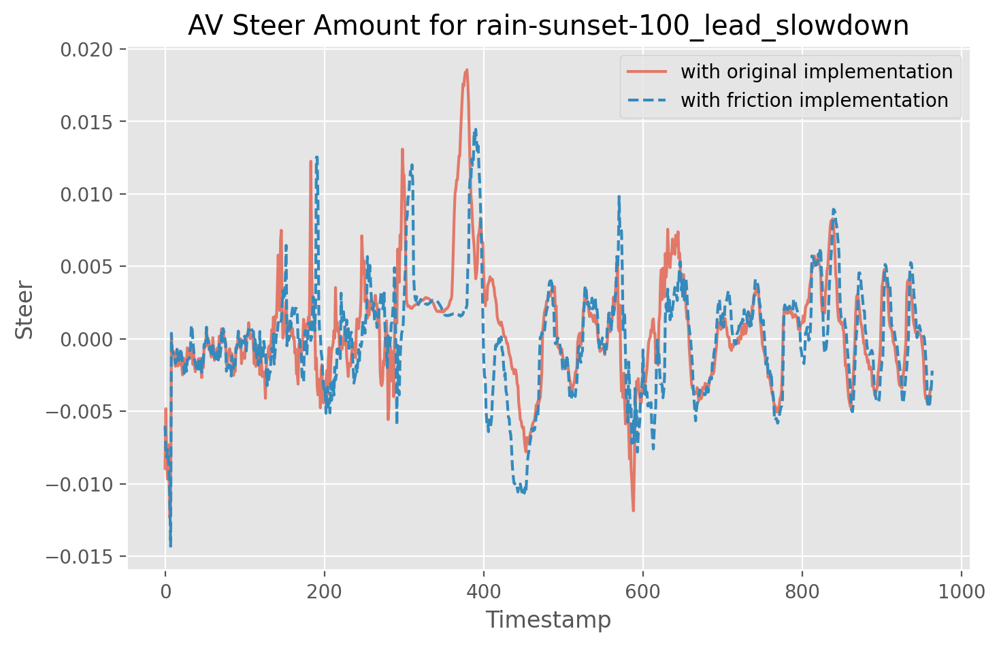

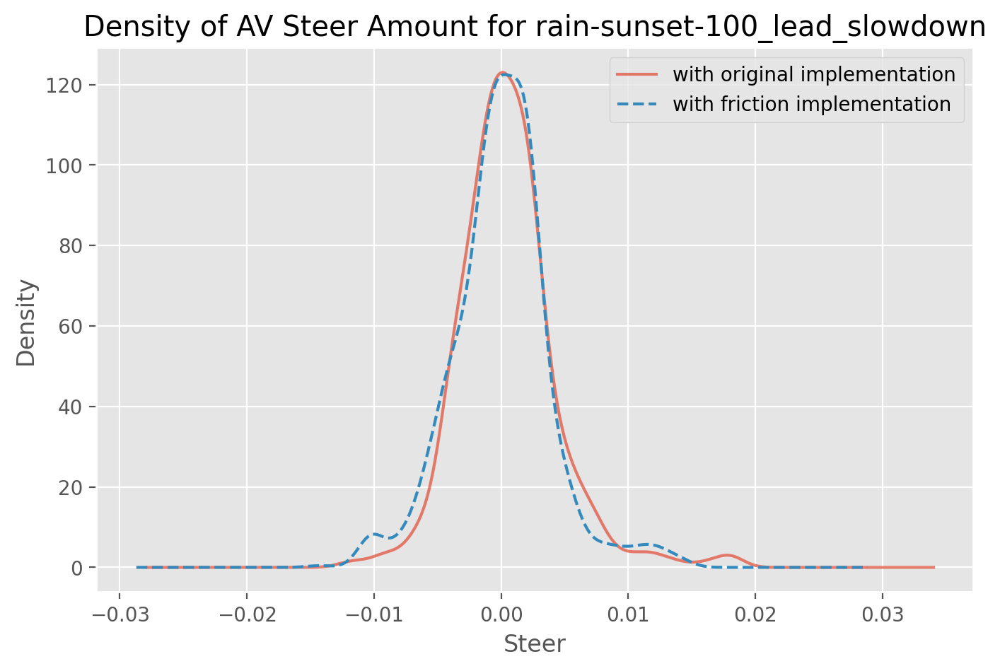

In [44]:
for weather in range(len(txt_lists_fric)):
    plt.figure(figsize=(8,5), dpi=200)
    df_orig_steer = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['steer'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_orig[weather][i]['steer'].isnull().values.any():
                df_orig_steer["Run"+str(i)] = df_array_orig[weather][i]['steer']

    median_orig_steer = df_orig_steer.median(axis=1)

    plt.plot(median_orig_steer, alpha=0.7)


    df_fric_steer = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['steer'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['steer'].isnull().values.any():
                df_fric_steer["Run"+str(i)] = df_array_fric[weather][i]['steer']

    median_fric_steer = df_fric_steer.median(axis=1)
    
    all_medians[weather][4][0] = median_orig_steer
    all_medians[weather][4][1] = median_fric_steer
    
    plt.plot(median_fric_steer, '--')
    
    plt.title(subfolders[weather])
    plt.legend(friction_legend)
    plt.xlabel("Timestamp")
    plt.ylabel("Steer")
    plt.title("AV Steer Amount for "+subfolders[weather])
    plt.show()
    
    plt.figure(figsize=(8,5), dpi=200)
    plt.xlabel("Steer")
    plt.ylabel("Density")
    median_orig_steer.plot.density(alpha=0.7)
    median_fric_steer.plot.density(style='--')
    plt.title("Density of AV Steer Amount for "+subfolders[weather])
    plt.legend(friction_legend)
    plt.show()

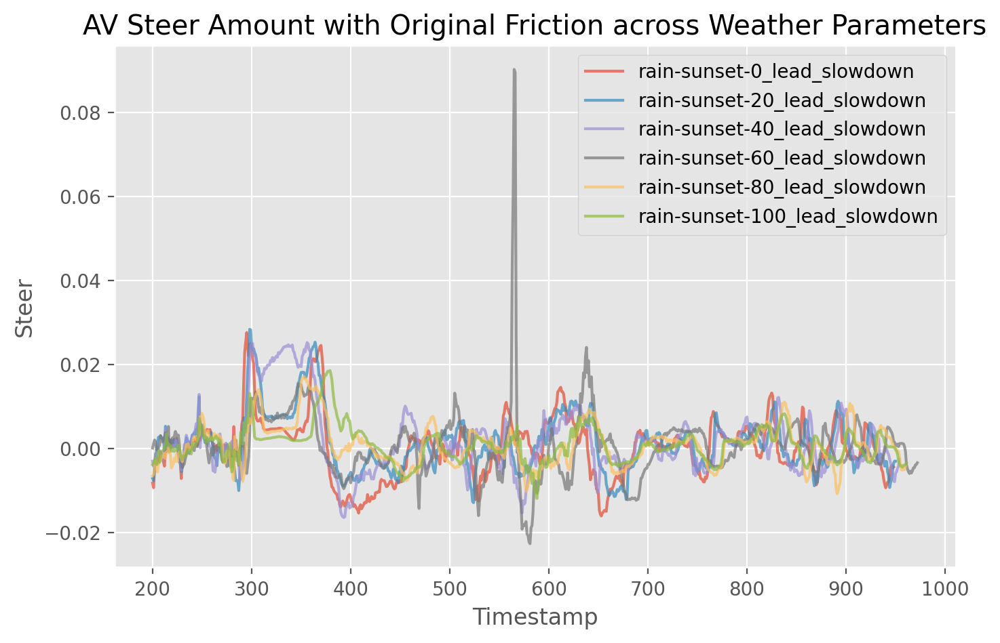

In [45]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):
    
    df_orig_steer = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['steer'].dtypes == 'steer'):
            print(i)
        else:
            if not df_array_orig[weather][i]['steer'].isnull().values.any():
                df_orig_steer["Run"+str(i)] = df_array_orig[weather][i]['steer']

    median_orig_steer = df_orig_steer.median(axis=1)


    plt.plot(median_orig_steer[200:], alpha=0.7)

plt.xlabel("Timestamp")
plt.ylabel("Steer")
plt.title("AV Steer Amount with Original Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

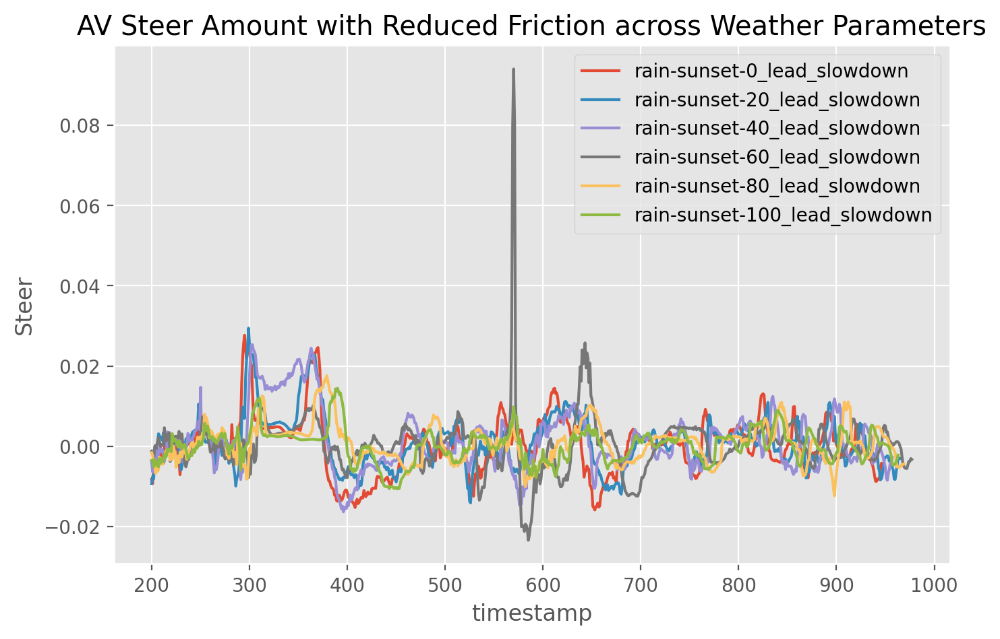

In [46]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):

    df_fric_steer = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['steer'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['steer'].isnull().values.any() :
                df_fric_steer["Run"+str(i)] = df_array_fric[weather][i]['steer']

    median_fric_steer = df_fric_steer.median(axis=1)

    plt.plot(median_fric_steer[200:])

    # plt.axis('equal')
plt.xlabel("timestamp")
plt.ylabel("Steer")
plt.title("AV Steer Amount with Reduced Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

### brake

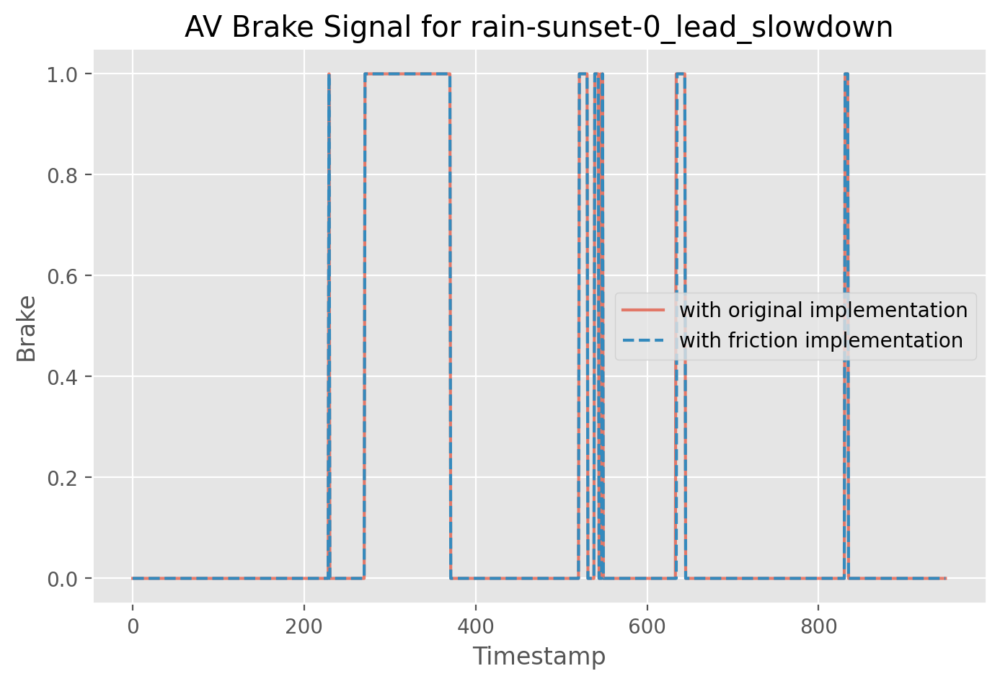

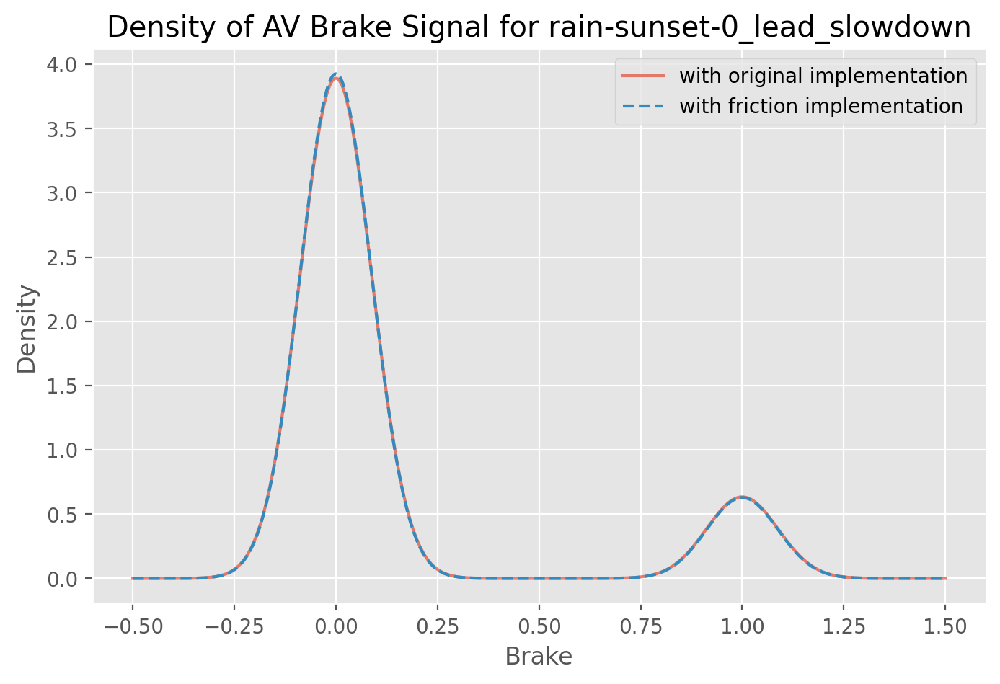

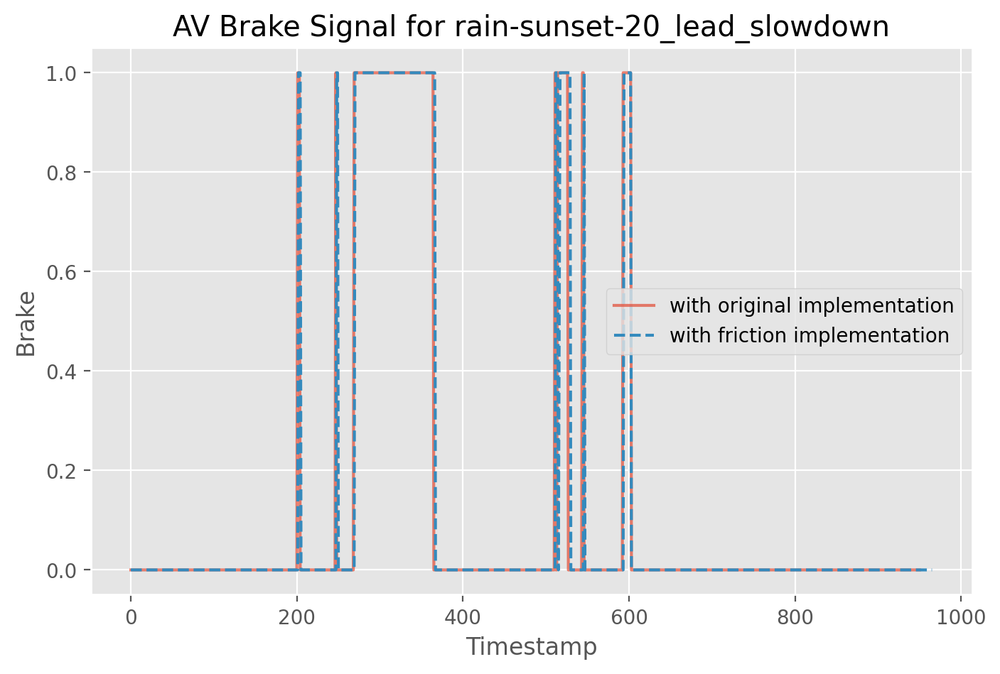

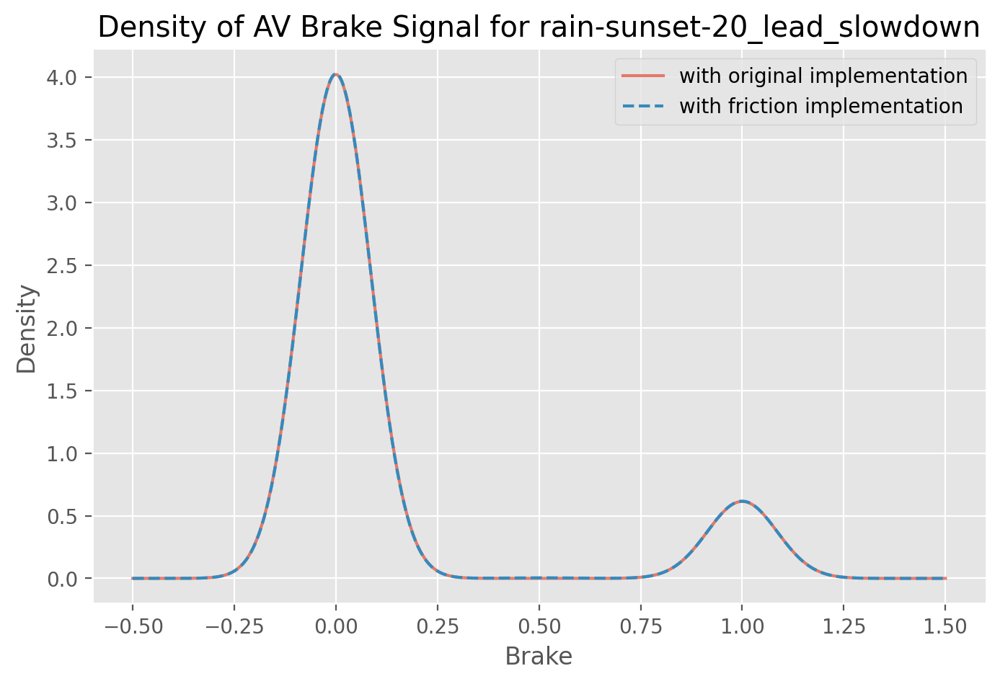

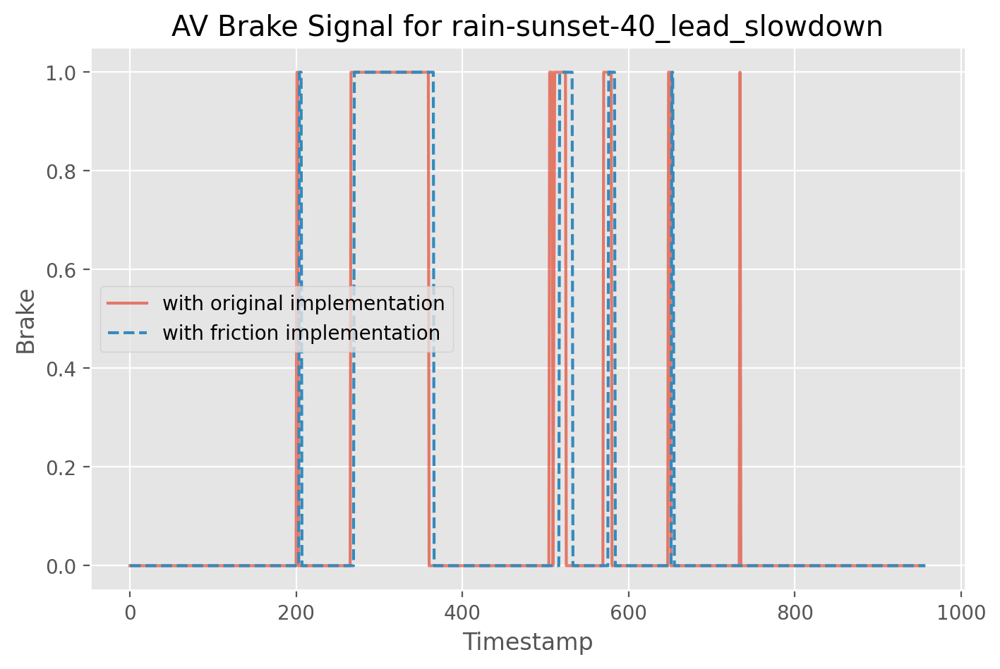

...

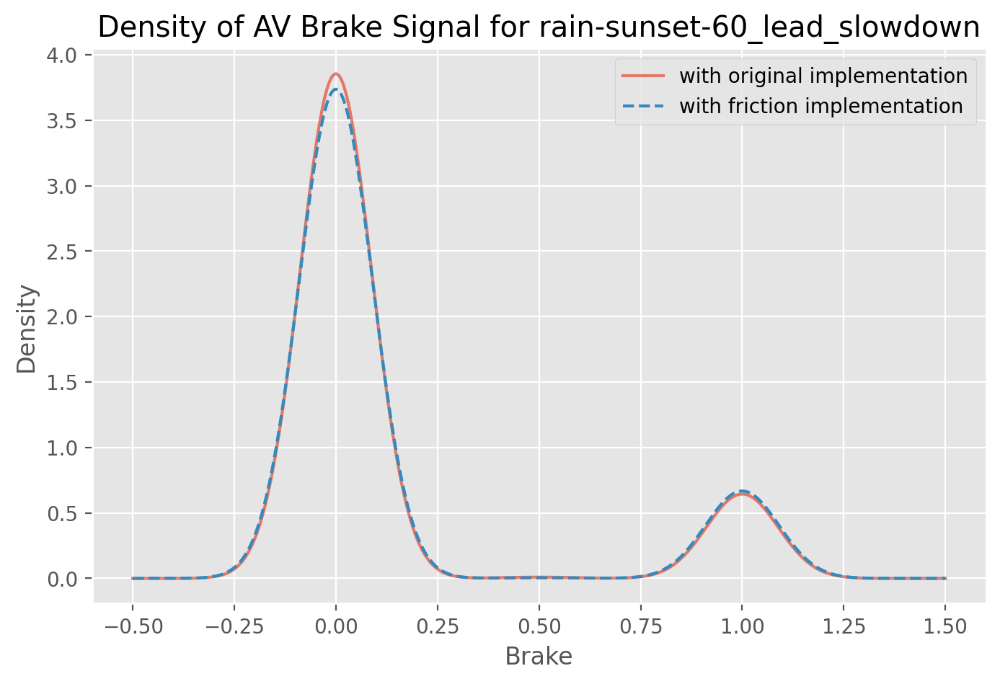

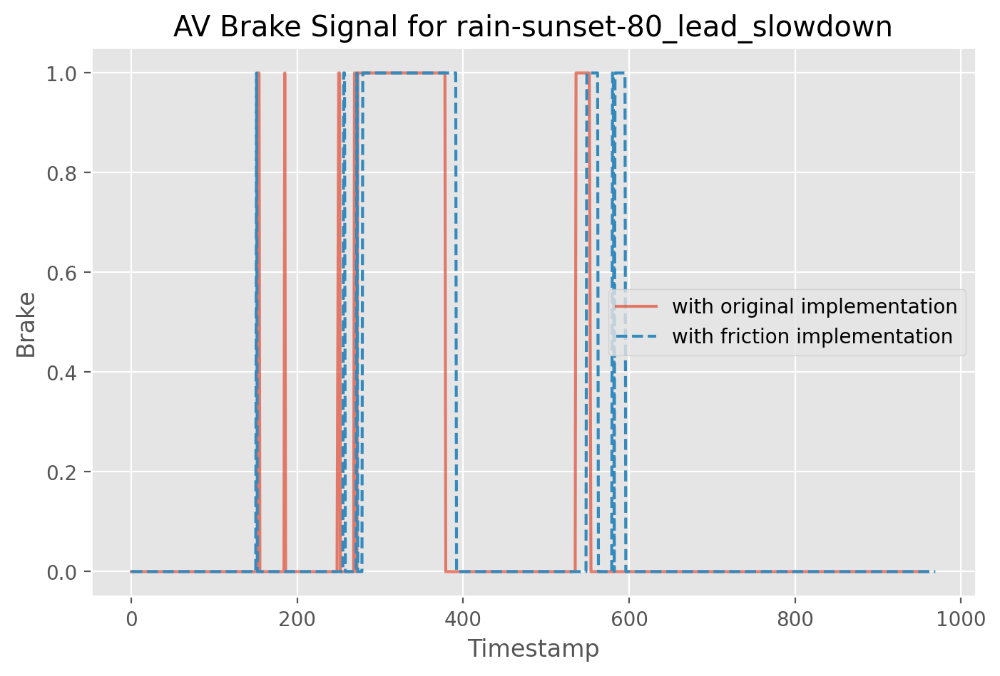

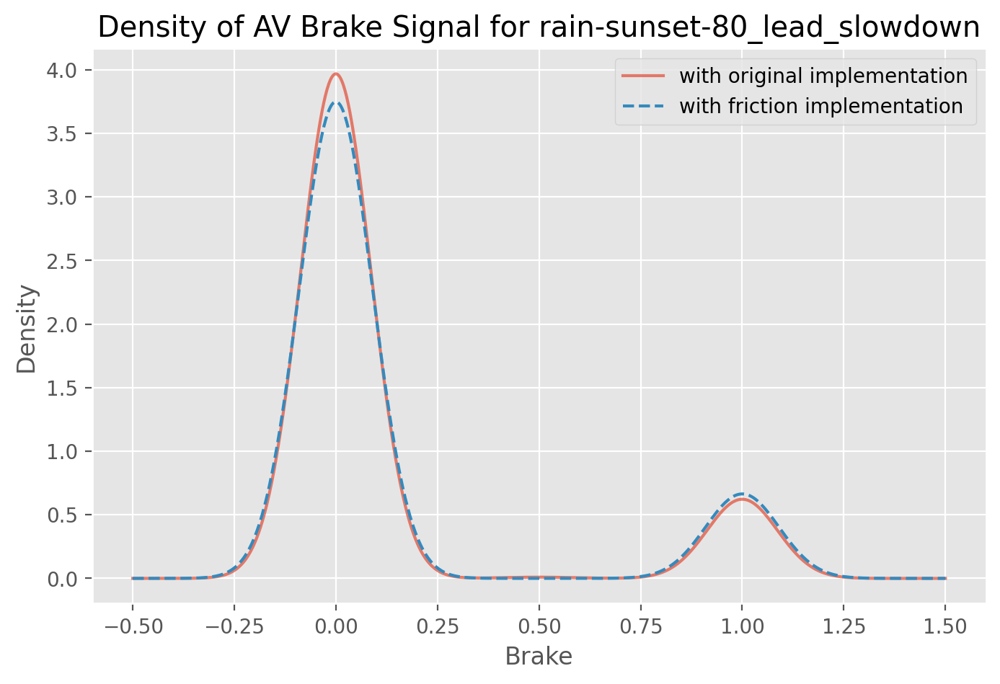

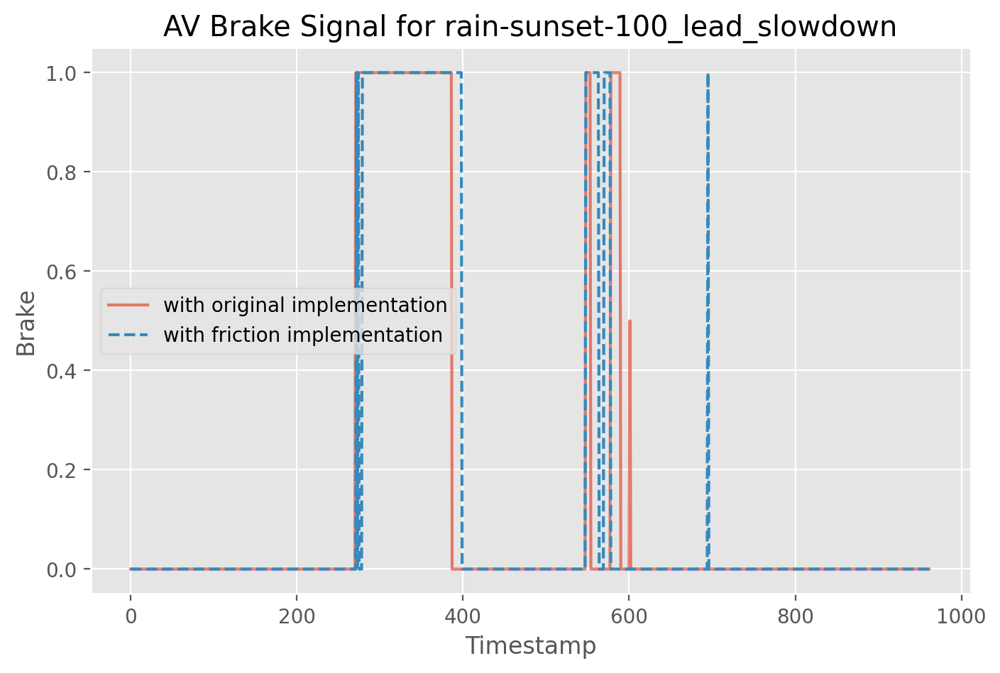

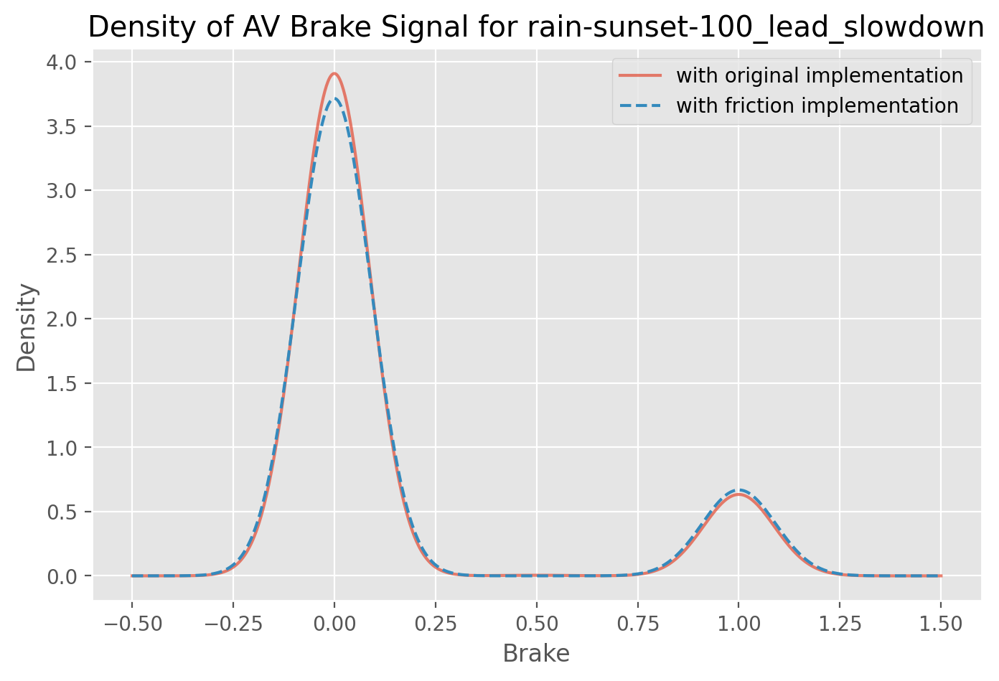

In [47]:
for weather in range(len(txt_lists_fric)):
    plt.figure(figsize=(8,5), dpi=200)
    df_orig_brake = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['brake'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_orig[weather][i]['brake'].isnull().values.any():
                df_orig_brake["Run"+str(i)] = df_array_orig[weather][i]['brake']

    median_orig_brake = df_orig_brake.median(axis=1)

    plt.plot(median_orig_brake, alpha=0.7)


    df_fric_brake = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['brake'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['brake'].isnull().values.any():
                df_fric_brake["Run"+str(i)] = df_array_fric[weather][i]['brake']

    median_fric_brake = df_fric_brake.median(axis=1)
    
    all_medians[weather][5][0] = median_orig_brake
    all_medians[weather][5][1] = median_fric_brake
    
    plt.plot(median_fric_brake, '--')
    
    plt.title(subfolders[weather])
    plt.legend(friction_legend)
    plt.xlabel("Timestamp")
    plt.ylabel("Brake")
    plt.title("AV Brake Signal for "+subfolders[weather])
    plt.show()
    
    plt.figure(figsize=(8,5), dpi=200)
    plt.xlabel("Brake")
    plt.ylabel("Density")
    median_orig_brake.plot.density(alpha=0.7)
    median_fric_brake.plot.density(style='--')
    plt.title("Density of AV Brake Signal for "+subfolders[weather])
    plt.legend(friction_legend)
    plt.show()


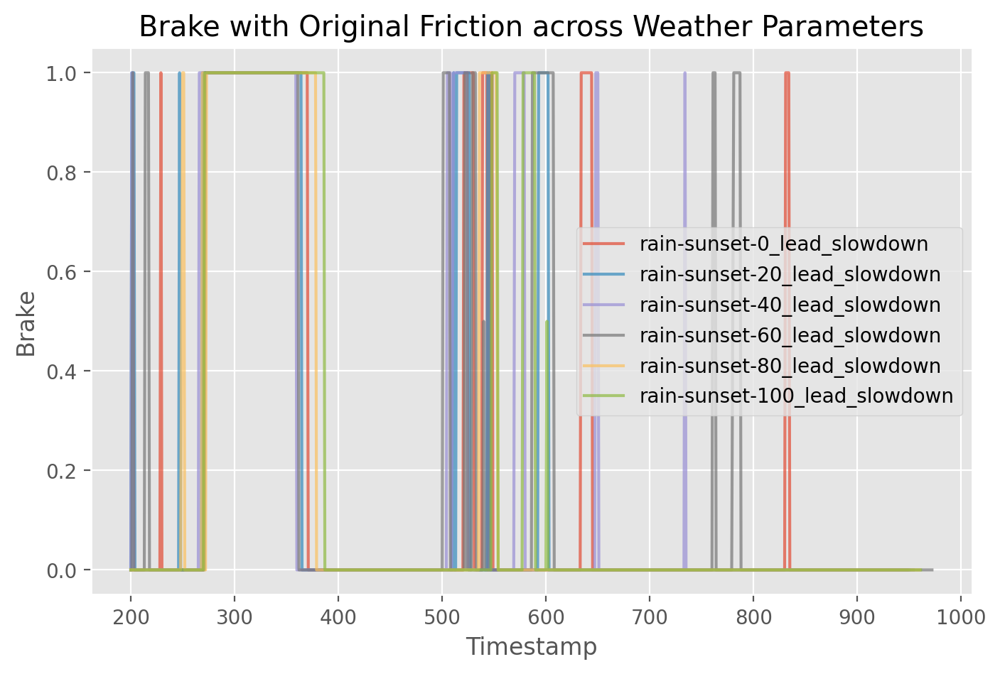

In [48]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):
    
    df_orig_brake = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['brake'].dtypes == 'brake'):
            print(i)
        else:
            if not df_array_orig[weather][i]['brake'].isnull().values.any():
                df_orig_brake["Run"+str(i)] = df_array_orig[weather][i]['brake']

    median_orig_brake = df_orig_brake.median(axis=1)


    plt.plot(median_orig_brake[200:], alpha=0.7)


plt.xlabel("Timestamp")
plt.ylabel("Brake")
plt.title("Brake with Original Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

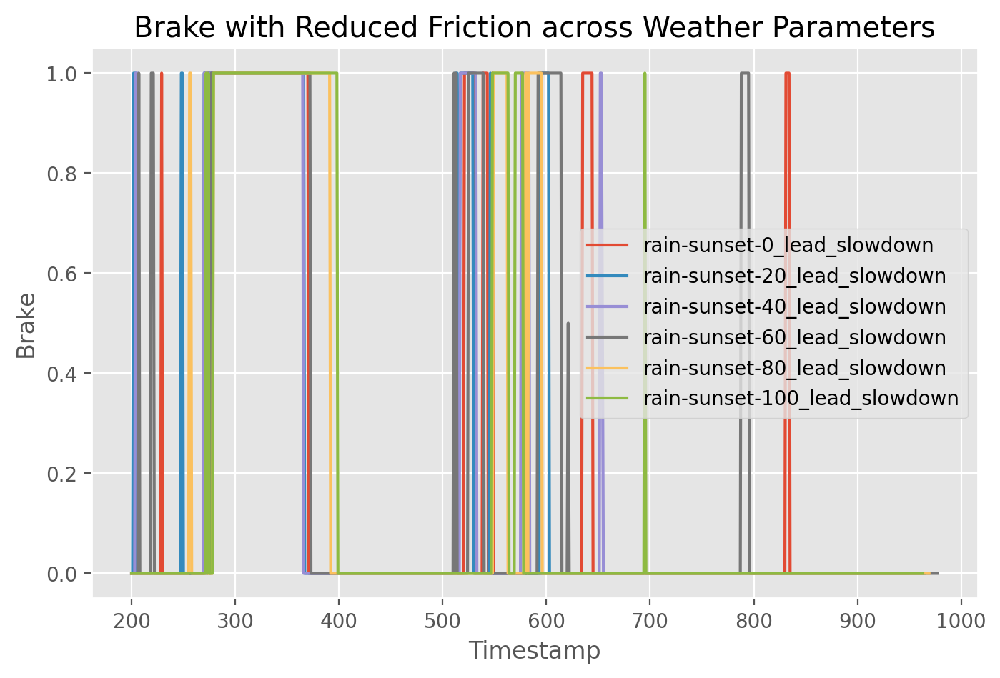

In [49]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):

    df_fric_brake = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['brake'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['brake'].isnull().values.any() :
                df_fric_brake["Run"+str(i)] = df_array_fric[weather][i]['brake']

    median_fric_brake = df_fric_brake.median(axis=1)

    plt.plot(median_fric_brake[200:])

plt.xlabel("Timestamp")
plt.ylabel("Brake")
plt.title("Brake with Reduced Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

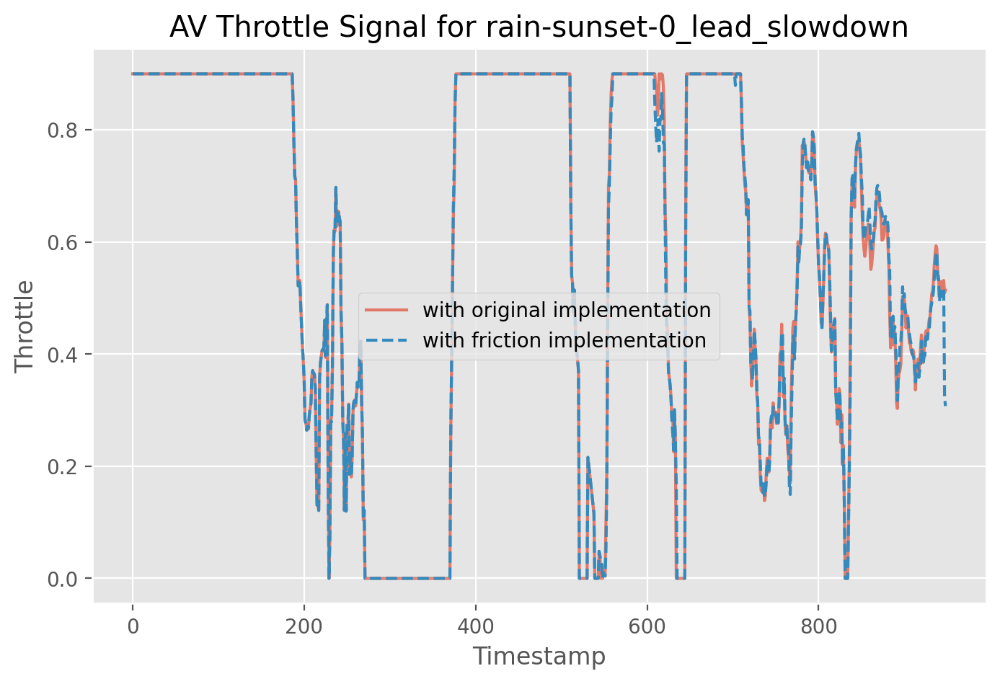

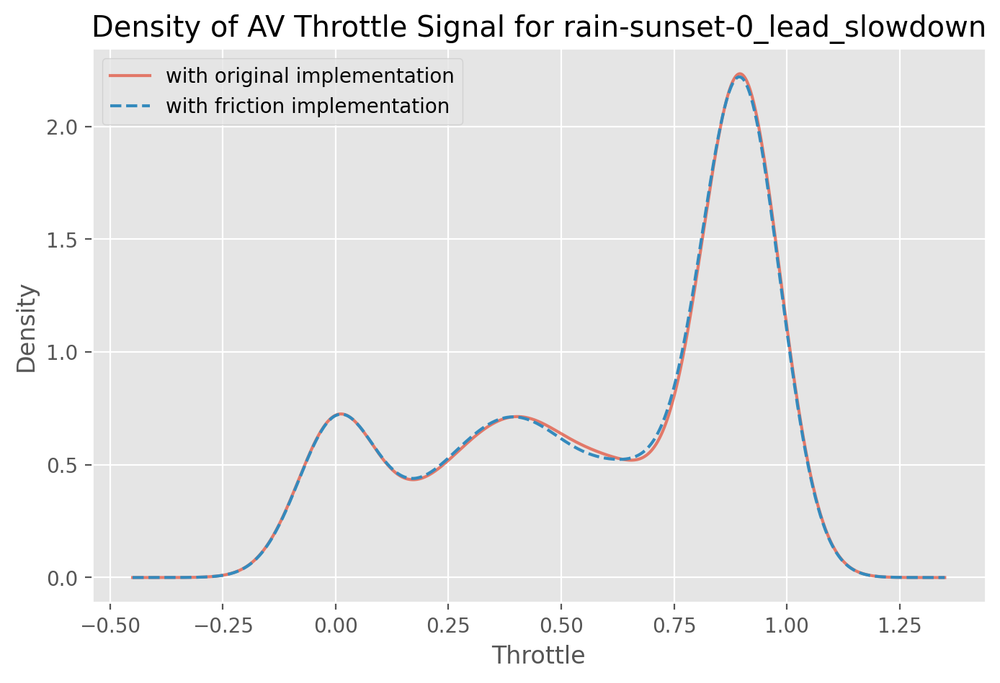

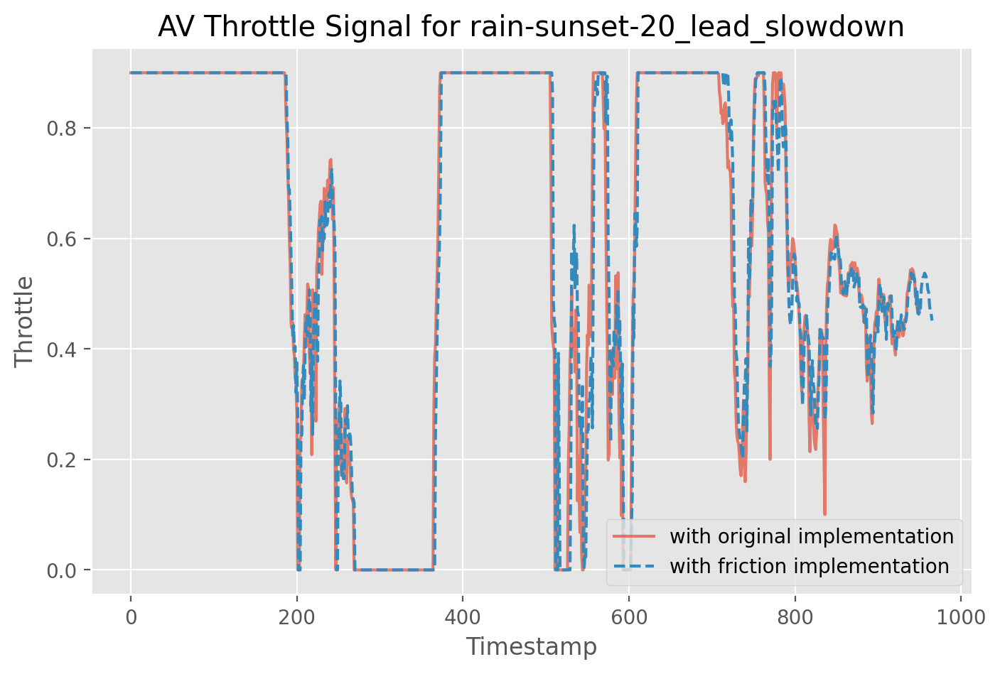

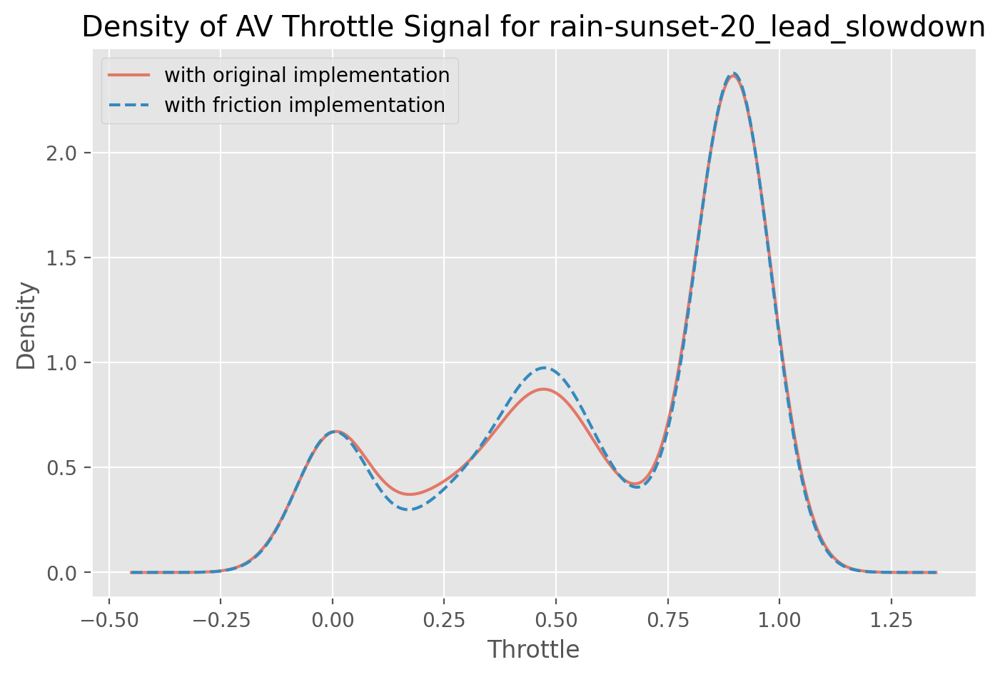

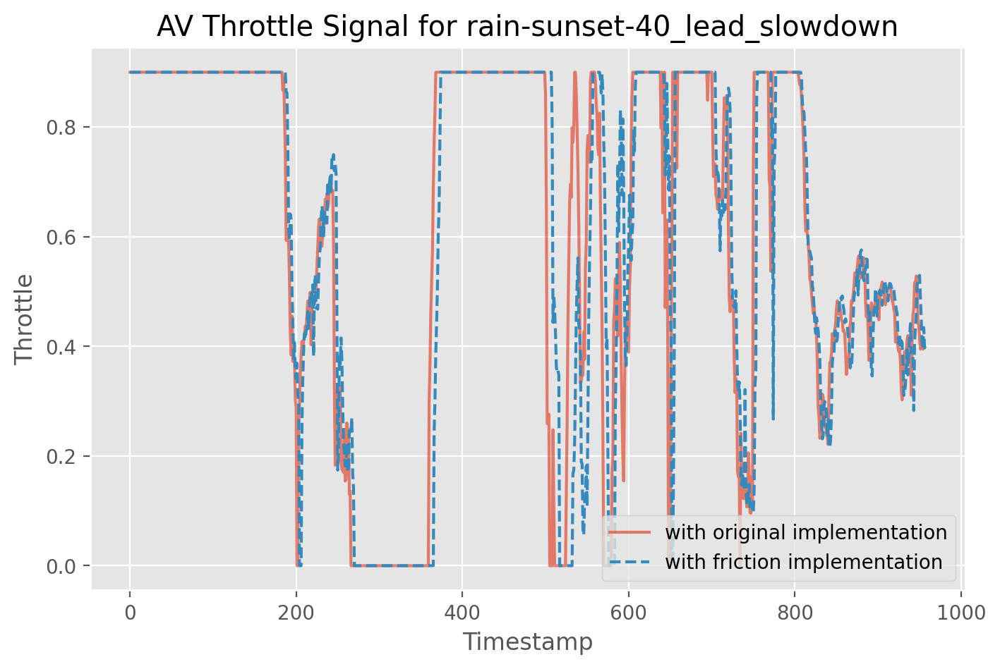

...

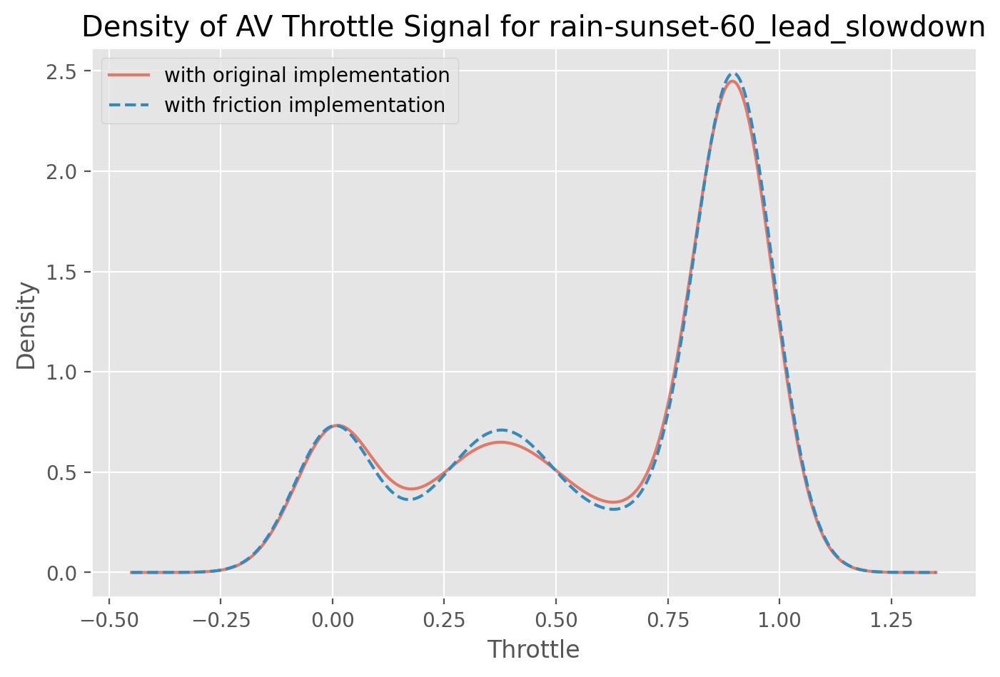

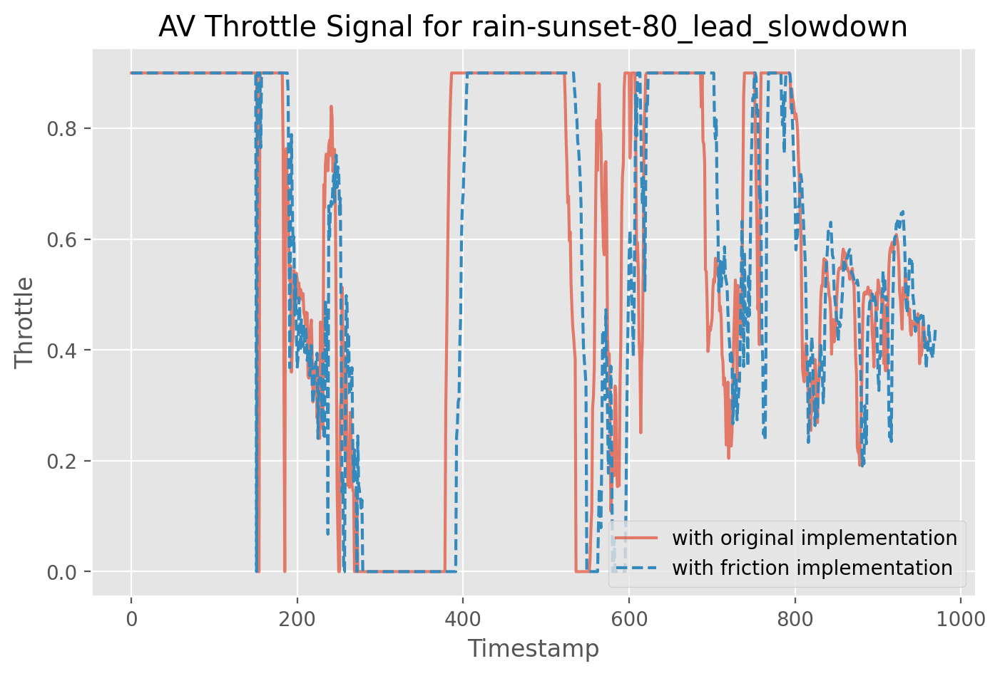

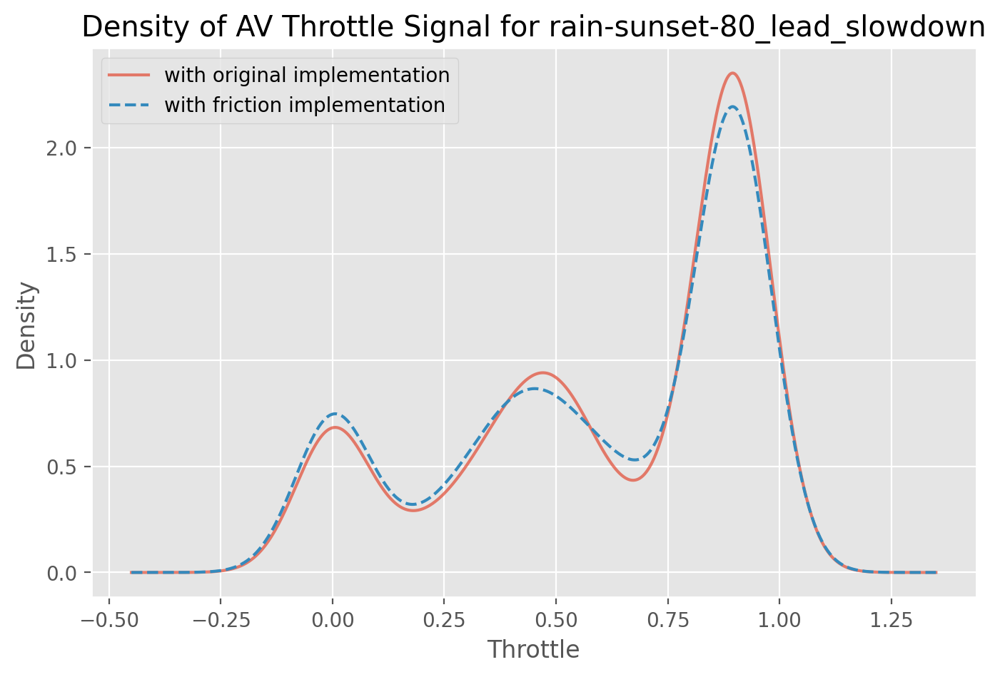

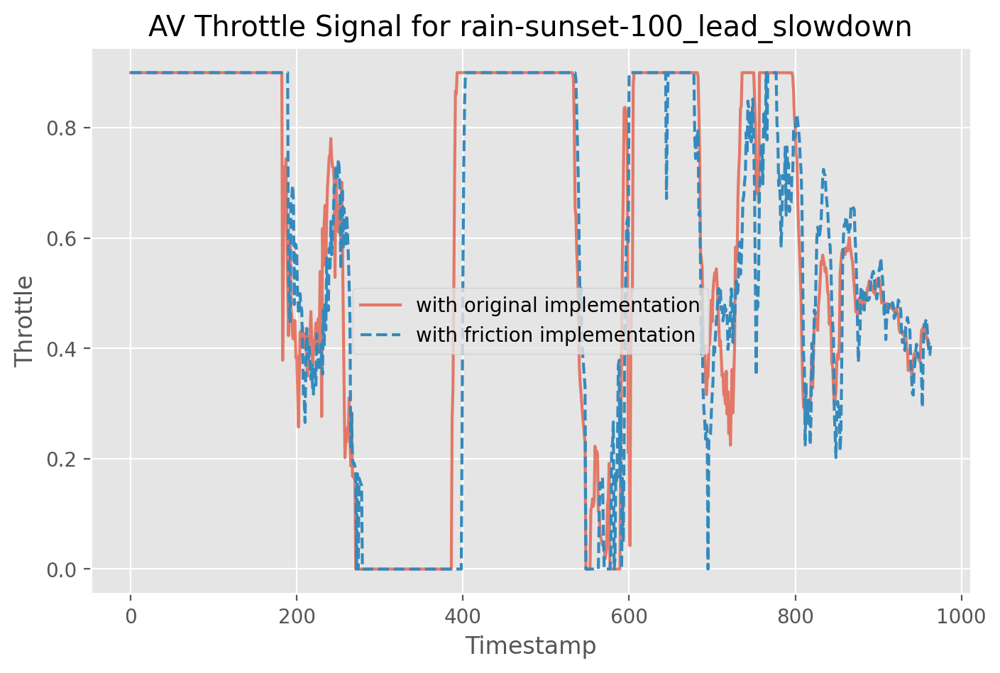

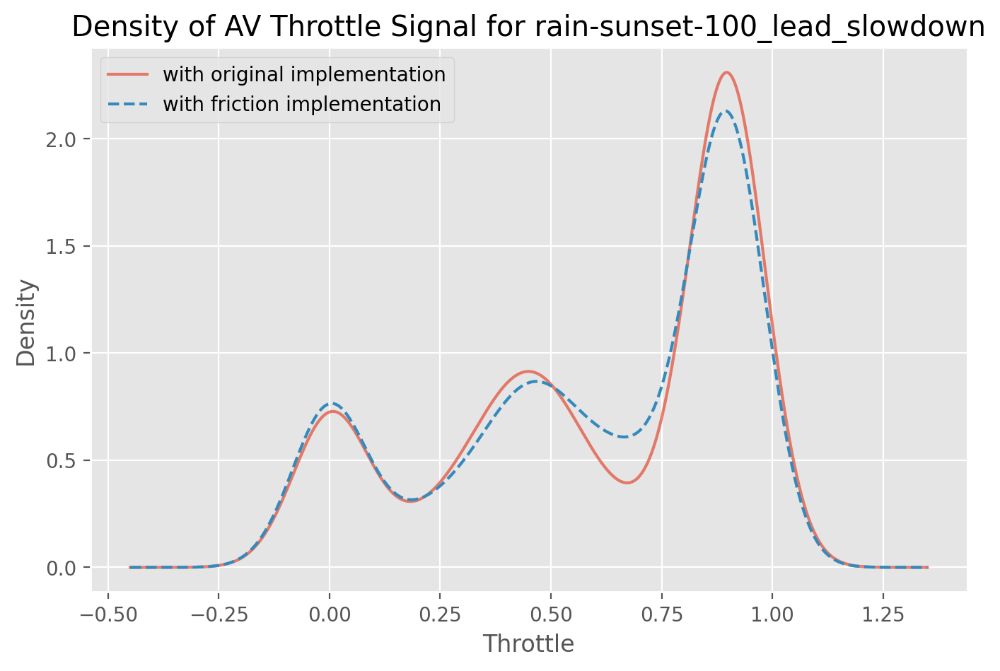

In [50]:
for weather in range(len(txt_lists_fric)):
    plt.figure(figsize=(8,5), dpi=200)
    df_orig_throttle = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['throttle'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_orig[weather][i]['throttle'].isnull().values.any():
                df_orig_throttle["Run"+str(i)] = df_array_orig[weather][i]['throttle']

    median_orig_throttle = df_orig_throttle.median(axis=1)

    plt.plot(median_orig_throttle, alpha=0.7)


    df_fric_throttle = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['throttle'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['throttle'].isnull().values.any():
                df_fric_throttle["Run"+str(i)] = df_array_fric[weather][i]['throttle']

    median_fric_throttle = df_fric_throttle.median(axis=1)
    
    all_medians[weather][6][0] = median_orig_throttle
    all_medians[weather][6][1] = median_fric_throttle
    
    plt.plot(median_fric_throttle, '--')
    
    plt.title(subfolders[weather])
    plt.legend(friction_legend)
    plt.xlabel("Timestamp")
    plt.ylabel("Throttle")
    plt.title("AV Throttle Signal for "+subfolders[weather])
    plt.show()
    
    plt.figure(figsize=(8,5), dpi=200)
    plt.xlabel("Throttle")
    plt.ylabel("Density")
    median_orig_throttle.plot.density(alpha=0.7)
    median_fric_throttle.plot.density(style='--')
    plt.title("Density of AV Throttle Signal for "+subfolders[weather])
    plt.legend(friction_legend)
    plt.show()
    

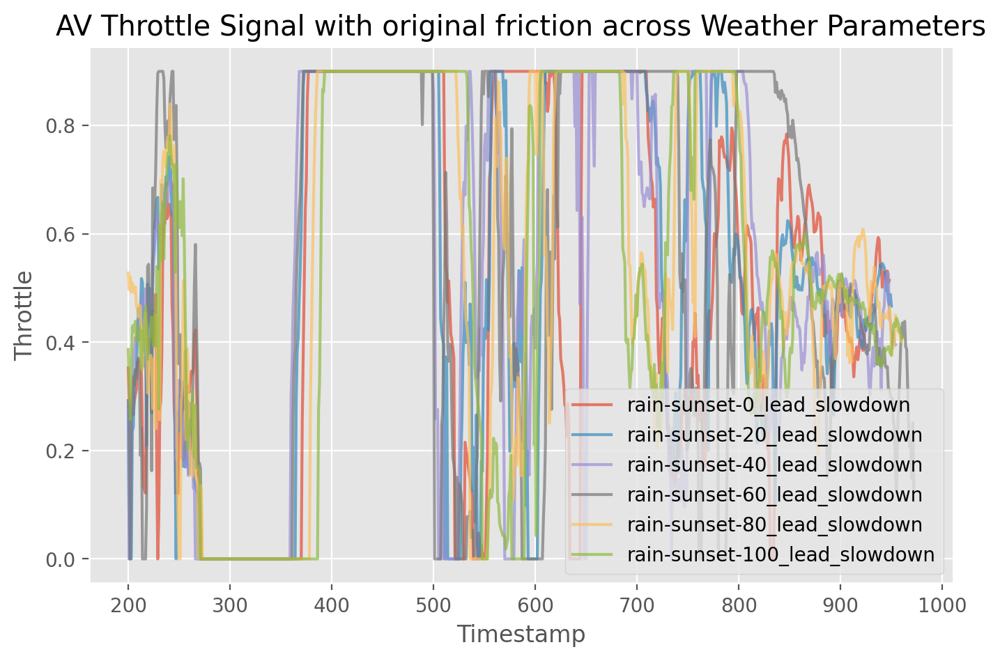

In [51]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):
    
    df_orig_throttle = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['throttle'].dtypes == 'throttle'):
            print(i)
        else:
            if not df_array_orig[weather][i]['throttle'].isnull().values.any():
                df_orig_throttle["Run"+str(i)] = df_array_orig[weather][i]['throttle']

    median_orig_throttle = df_orig_throttle.median(axis=1)


    plt.plot(median_orig_throttle[200:], alpha=0.7)


plt.xlabel("Timestamp")
plt.ylabel("Throttle")
plt.title("AV Throttle Signal with original friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

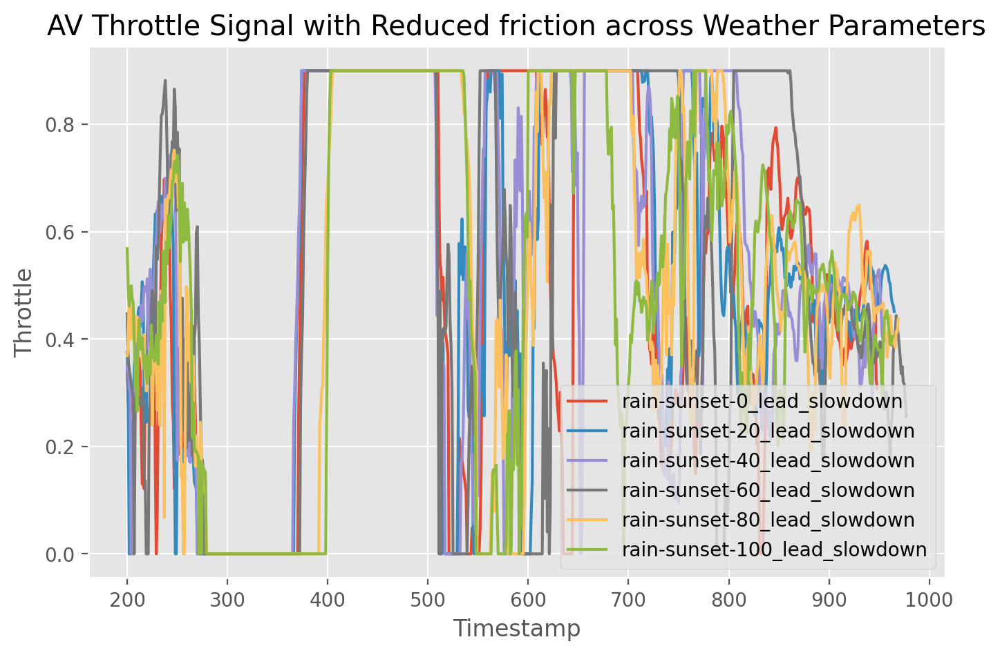

In [52]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):
    
    df_fric_throttle = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['throttle'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['throttle'].isnull().values.any() :
                df_fric_throttle["Run"+str(i)] = df_array_fric[weather][i]['throttle']

    median_fric_throttle = df_fric_throttle.median(axis=1)

    plt.plot(median_fric_throttle[200:])

    # plt.axis('equal')
plt.xlabel("Timestamp")
plt.ylabel("Throttle")
plt.title("AV Throttle Signal with Reduced friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

## Dynamic time warping (DTW) for cvip
### measuring similarity between two temporal sequences

In [53]:
all_dtw = [[0] * len(attribute_order)  for i in range(len(txt_lists_fric))]

for i in range(len(txt_lists_fric)):
    for j in range(len(attribute_order)):
        all_dtw[i][j] = dtw.distance(all_medians[i][j][0], all_medians[i][j][1])

In [54]:
for i in range(len(txt_lists_fric)):
    for j in range(len(attribute_order)):
        all_dtw[i][j] = round(all_dtw[i][j],2)

In [55]:
df = pd.DataFrame(all_dtw, columns = attribute_order, dtype = float)
df.index = subfolders
df.to_csv("DTW_lead_slowdown_rainy.csv")
df

,x,y,v,cvip,steer,brake,throttle
rain-sunset-0_lead_slowdown,0.01,0.72,0.67,0.32,0.01,1.00,0.41
rain-sunset-20_lead_slowdown,0.06,3.66,0.98,13.75,0.02,0.50,0.89
rain-sunset-40_lead_slowdown,0.02,1.23,1.46,2.63,0.02,1.58,1.49
rain-sunset-60_lead_slowdown,0.03,1.40,1.97,2.68,0.05,1.50,1.27
rain-sunset-80_lead_slowdown,0.02,1.39,3.38,3.45,0.03,1.22,1.53
rain-sunset-100_lead_slowdown,0.12,1.51,1.80,9.14,0.03,1.50,1.48


## KS Test for cvip

In [56]:
import scipy as sp

In [57]:
all_ks = np.empty((len(txt_lists_fric), len(attribute_order), 2))
# [[0] * len(attribute_order)  for i in range(len(txt_lists_fric)-1)]
for i in range(len(txt_lists_fric)-1):
    for j in range(len(attribute_order)):
        ks_test = sp.stats.ks_2samp(all_medians[i][j][0], all_medians[i][j][1])
        all_ks[i][j][0] = ks_test.pvalue
        all_ks[i][j][1] = ks_test.statistic

In [58]:
df = pd.DataFrame(all_ks[:,:,0], columns = attribute_order, dtype = float)
df.index = subfolders
df

,x,y,v,cvip,steer,brake,throttle
rain-sunset-0_lead_slowdown,1.142275e-02,7.341630e-02,9.608264e-01,6.535407e-01,1.000000e+00,1.000000e+00,1.000000e+00
rain-sunset-20_lead_slowdown,2.914988e-05,7.746248e-03,8.577579e-01,5.392339e-01,3.034822e-01,1.000000e+00,9.244990e-01
rain-sunset-40_lead_slowdown,3.293936e-05,1.090922e-02,6.075874e-01,2.480814e-01,6.352016e-01,1.000000e+00,9.999944e-01
rain-sunset-60_lead_slowdown,7.960773e-05,5.947517e-03,4.354106e-01,1.840290e-01,1.127123e-01,1.000000e+00,7.845487e-01
rain-sunset-80_lead_slowdown,3.596353e-08,8.920379e-06,1.204679e-01,1.383325e-02,2.925403e-01,9.997628e-01,4.458859e-01
rain-sunset-100_lead_slowdown,1.134970e-311,1.134968e-311,1.134970e-311,1.134969e-311,1.134970e-311,1.134970e-311,1.134965e-311


In [59]:
df = pd.DataFrame(all_ks[:,:,1], columns = attribute_order, dtype = float)
df.index = subfolders
df

,x,y,v,cvip,steer,brake,throttle
rain-sunset-0_lead_slowdown,7.376185e-02,5.900948e-02,2.318230e-02,3.371970e-02,8.429926e-03,2.107482e-03,1.159115e-02
rain-sunset-20_lead_slowdown,1.072229e-01,7.561181e-02,2.714697e-02,3.619596e-02,4.382441e-02,1.048259e-03,2.456388e-02
rain-sunset-40_lead_slowdown,1.067494e-01,7.328422e-02,3.430030e-02,4.618697e-02,3.359311e-02,3.554526e-03,1.296768e-02
rain-sunset-60_lead_slowdown,1.013573e-01,7.671234e-02,3.890525e-02,4.895785e-02,5.380026e-02,8.472100e-03,2.916475e-02
rain-sunset-80_lead_slowdown,1.352436e-01,1.123797e-01,5.344733e-02,7.126812e-02,4.409282e-02,1.523971e-02,3.878477e-02
rain-sunset-100_lead_slowdown,1.134969e-311,1.134969e-311,1.134968e-311,1.134970e-311,1.134965e-311,1.134971e-311,1.134971e-311
